In [8]:
images = []
lesions = []
images_file = []
lesions_file = []
from skimage.io import imread
import os
import json
root = 'plate_dataset'

with open(f'{root}/joined-coordinat.json',"r") as f:
    items=json.load(f)

for root, dirs, files in os.walk(root):
#     print(root,dirs,files)
    files.sort()
    if root.endswith('image'):
        print('images:', len(files))
        for f in files:
            if f not in items:
                print(f)
                continue
            images.append(imread(os.path.join(root, f)))
            images_file.append(f)
    if root.endswith('mask'):
        print('masks:', len(files))
        
        for f in files:
            lesions.append(imread(os.path.join(root, f)))
            lesions_file.append(f)
            

masks: 270
images: 594
crop_info.json
img_1608.jpg.jpg
img_1612.jpg.jpg
img_1665.jpg.jpg
img_1666.jpg.jpg
img_1667.jpg.jpg
img_1672.jpg.jpg
img_1677.jpg.jpg
img_1681.jpg.jpg
img_1688.jpg.jpg
img_1709.jpg.jpg
img_1847.jpg.jpg
img_1853.jpg.jpg
img_1878.jpg.jpg
img_1882.jpg.jpg
img_1890.jpg.jpg
img_1896.jpg.jpg
img_1899.jpg.jpg
img_1907.jpg.jpg
img_1937.jpg.jpg
img_1938.jpg.jpg
img_1939.jpg.jpg
img_1966.jpg.jpg
img_1967.jpg.jpg
img_1968.jpg.jpg
img_2030.jpg.jpg
img_2331.jpg.jpg
img_2332.jpg.jpg
img_2333.jpg.jpg
img_2341.jpg.jpg
img_2398.jpg.jpg
img_2404.jpg.jpg
img_2405.jpg.jpg
img_2406.jpg.jpg
img_2408.jpg.jpg
img_2409.jpg.jpg
img_2410.jpg.jpg
img_2411.jpg.jpg
img_2418.jpg.jpg
img_2420.jpg.jpg
img_2422.jpg.jpg
img_2423.jpg.jpg
img_2426.jpg.jpg
img_2427.jpg.jpg
img_2429.jpg.jpg
img_2430.jpg.jpg
img_2432.jpg.jpg
img_2434.jpg.jpg
img_2436.jpg.jpg
img_2437.jpg.jpg
img_2440.jpg.jpg
img_2442.jpg.jpg
img_2443.jpg.jpg
img_2445.jpg.jpg
img_2449.jpg.jpg
img_2450.jpg.jpg
img_2451.jpg.jpg
img_2452.j

In [9]:
len(lesions)==len(images)

True

In [10]:
images_file[100]

'img_1675.jpg.jpg'

In [11]:
lesions_file[100]

'img_1675.jpg.jpg.png'

In [12]:
len(images)

270

In [13]:
len(lesions)

270

In [14]:
lesions[0].shape

(179, 497)

In [15]:
from skimage.transform import resize
size = (256, 256)
X = [resize(x, size, mode='constant', anti_aliasing=True,) for x in images]
Y = [resize(y, size, mode='constant', anti_aliasing=False) > 0.5 for y in lesions]

In [16]:
Y[0]

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [17]:
import numpy as np
X = np.array(X, np.float32)
Y = np.array(Y, np.float32)
print(f'Loaded {len(X)} images')

Loaded 270 images


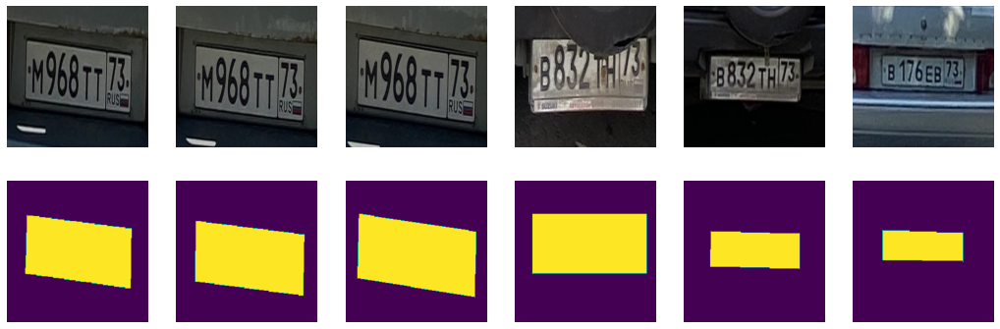

In [18]:
import matplotlib.pyplot as plt
from IPython.display import clear_output

plt.figure(figsize=(18, 6))
for i in range(6):
    plt.subplot(2, 6, i+1)
    plt.axis("off")
    plt.imshow(X[i])

    plt.subplot(2, 6, i+7)
    plt.axis("off")
    plt.imshow(Y[i])
plt.show();

In [23]:
ix = np.random.choice(len(X), len(X), False)
tr, val, ts = np.split(ix, [220, 269])

In [24]:
print(len(tr), len(val), len(ts))

220 49 1


In [25]:
from torch.utils.data import DataLoader
batch_size = 20
data_tr = DataLoader(list(zip(np.rollaxis(X[tr], 3, 1), Y[tr, np.newaxis])), 
                     batch_size=batch_size, shuffle=True)
data_val = DataLoader(list(zip(np.rollaxis(X[val], 3, 1), Y[val, np.newaxis])),
                      batch_size=batch_size, shuffle=True)
data_ts = DataLoader(list(zip(np.rollaxis(X[ts], 3, 1), Y[ts, np.newaxis])),
                     batch_size=batch_size, shuffle=True)

In [26]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [17]:
!pip install -q -U albumentations
!echo "$(pip freeze | grep albumentations) is successfully installed"

albumentations==1.2.1 is successfully installed


In [27]:
import albumentations as A
import albumentations.augmentations.functional as F
from albumentations.pytorch import ToTensorV2
import cv2
import matplotlib.pyplot as plt
import numpy as np

In [28]:
def display_image_grid(images,lessons):
    cols = 2
    rows = 5
    figure, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(10, 24))
    for i in range(rows):
        image=images[i]
        mask=lessons[i]

        ax[i, 0].imshow(image)
        ax[i, 1].imshow(mask, interpolation="nearest")

        ax[i, 0].set_title("Image")
        ax[i, 1].set_title("Ground truth mask")

        ax[i, 0].set_axis_off()
        ax[i, 1].set_axis_off()

    
    plt.show()
    ;

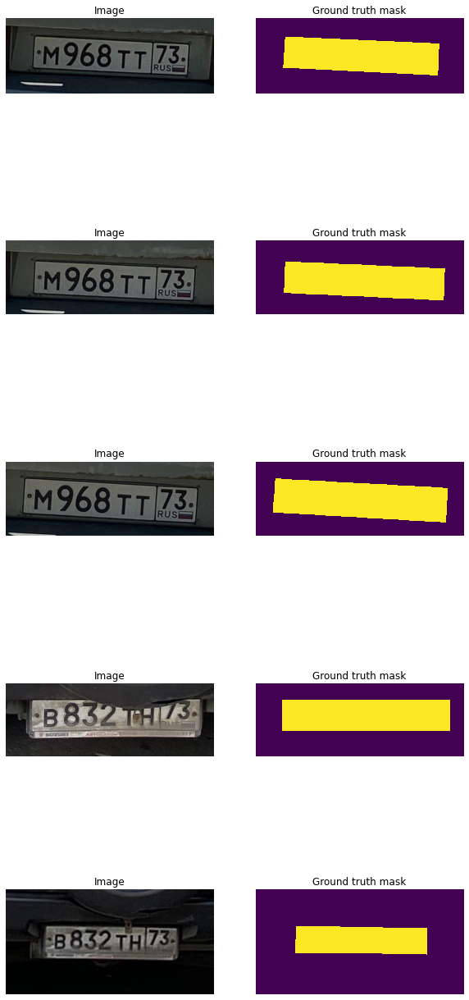

In [29]:
display_image_grid(images,lesions)

In [30]:
import torch
import torch.backends.cudnn as cudnn
import torch.nn as nn
import torch.optim
from torch.utils.data import Dataset, DataLoader

from collections import defaultdict
import copy
import random
import os
import shutil

class PaperMaskDataset(Dataset):
    def __init__(self, images, lesions, transform=None):
        self.images = images
        self.lesions = lesions
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        mask = self.lesions[idx]
        if self.transform is not None:
            transformed = self.transform(image=image, mask=mask)
            image = transformed["image"]
            mask = transformed["mask"]
        return image, mask

In [31]:
train_transform = A.Compose(
    [
        A.Resize(256, 256),
        A.ShiftScaleRotate(shift_limit=0.2, scale_limit=0.5, rotate_limit=40,border_mode=cv2.BORDER_CONSTANT,value=0, p=0.8),
        A.RGBShift(r_shift_limit=25, g_shift_limit=25, b_shift_limit=25, p=0.8),
        A.RandomBrightnessContrast(brightness_limit=0.3, contrast_limit=0.3, p=0.8),
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ]
)

train_dataset = PaperMaskDataset(np.array(images)[tr], np.array(lesions)[tr], transform=train_transform,)
val_dataset = PaperMaskDataset(np.array(images)[val], np.array(lesions)[val], transform=train_transform,)
;

/tmp/ipykernel_57219/3646082299.py:12: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  train_dataset = PaperMaskDataset(np.array(images)[tr], np.array(lesions)[tr], transform=train_transform,)
/tmp/ipykernel_57219/3646082299.py:13: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  val_dataset = PaperMaskDataset(np.array(images)[val], np.array(lesions)[val], transform=train_transform,)


''

In [32]:
def visualize_augmentations(dataset, idx=0, samples=5):
    dataset = copy.deepcopy(dataset)
    dataset.transform = A.Compose([t for t in dataset.transform if not isinstance(t, (A.Normalize, ToTensorV2))])
    figure, ax = plt.subplots(nrows=samples, ncols=2, figsize=(10, 24))
    for i in range(samples):
        image, mask = dataset[idx]
        ax[i, 0].imshow(image)
        ax[i, 1].imshow(mask, interpolation="nearest")
        ax[i, 0].set_title("Augmented image")
        ax[i, 1].set_title("Augmented mask")
        ax[i, 0].set_axis_off()
        ax[i, 1].set_axis_off()
    plt.tight_layout()
    plt.show()

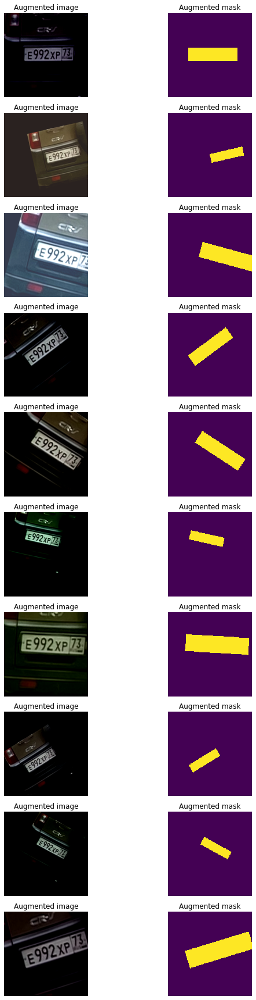

In [33]:
visualize_augmentations(val_dataset, idx=4,samples=10)

# Losses

In [34]:
def iou_pytorch(outputs: torch.Tensor, labels: torch.Tensor):
    # You can comment out this line if you are passing tensors of equal shape
    # But if you are passing output from UNet or something it will most probably
    # be with the BATCH x 1 x H x W shape
    outputs = outputs.squeeze(1).byte()  # BATCH x 1 x H x W => BATCH x H x W
    labels = labels.squeeze(1).byte()
    SMOOTH = 1e-8
    # print('outputs:',torch.min(outputs),torch.max(outputs))
    # print('labels:',torch.min(labels),torch.max(labels))
    intersection = (outputs & labels).float().sum((1, 2))  # Will be zero if Truth=0 or Prediction=0
    # print('intersection:',torch.min(intersection),torch.max(intersection))
    
    union = (outputs | labels).float().sum((1, 2))         # Will be zzero if both are 0
    # print('union:',torch.min(union),torch.max(union))
    
    iou = (intersection + SMOOTH) / (union + SMOOTH)  # We smooth our devision to avoid 0/0
    
    # thresholded = torch.clamp(20 * (iou - 0.5), 0, 10).ceil() / 10  # This is equal to comparing with thresolds
    
    return iou  # 

In [35]:
def predict(model, data):
    model.eval()  # testing mode
    Y_pred = [ X_batch for X_batch, _ in data]
    return np.array(Y_pred)

In [36]:
def score_model(model, metric):
    model.eval()  # testing mode
    scores = 0
#     data = DataLoader(data_ts,
#                      batch_size=batch_size, shuffle=False)
    
    for X_batch, Y_label in data_ts:
        Y_pred = model(X_batch.to(device))
        scores += metric(torch.round(torch.sigmoid(Y_pred)), Y_label.to(device)).mean().item()

    return scores/len(data_ts)

In [37]:
import seaborn as sns

def draw_losses(losses,title=None):
    sns.set(style="whitegrid", font_scale=1.4)

    types=['train','val','test']

    #Ваш код здесь
    plt.figure(figsize=(12, 8))
    for t in types:
        if t in losses:
            plt.plot(losses[t], label=t)
    plt.legend()
    if title is not None:
        plt.suptitle(title)
    plt.show()

def draw_scores(losses,title=None):
    sns.set(style="whitegrid", font_scale=1.4)

    types=['score']

    #Ваш код здесь
    plt.figure(figsize=(12, 8))
    for t in types:
        if t in losses:
            plt.plot(losses[t], label=t)
    plt.legend()
    if title is not None:
        plt.suptitle(title)
    plt.show()

In [38]:
def draw_images(x,y_pred,y_real):
    for k in range(4):
        if x is not None:
            plt.subplot(3, 4, k+1)
            xk=np.moveaxis(x[k].numpy(), 0, -1)
            plt.imshow(xk)
            plt.title('Real')
            plt.axis('off')

        if y_pred is not None:
            plt.subplot(3, 4, k+5)
            plt.imshow(y_pred[k,0])
            plt.title('Output')
            plt.axis('off')

        if y_real is not None:
            plt.subplot(3, 4, k+9)
            plt.imshow(y_real[k,0])
            plt.title('Mask')
            plt.axis('off')
    # plt.suptitle('%d / %d - loss: %f' % (epoch+1, epochs, avg_loss))
    plt.show()

# Models

In [39]:
class UNet(nn.Module):
    def __init__(self):
        super().__init__()

        self.up0 = self.conv_layer(n=2,in_channels=3,out_channels=64, add_last_relu=True) 
        self.up1 = self.conv_layer(n=2,in_channels=64,out_channels=128, add_last_relu=True) 
        self.up2 = self.conv_layer(n=2,in_channels=128,out_channels=256, add_last_relu=True) 
        self.up3 = self.conv_layer(n=2,in_channels=256,out_channels=512, add_last_relu=True) 
        self.up4 = self.conv_layer(n=2,in_channels=512,out_channels=1024, add_last_relu=True) 

        self.maxPool =  nn.MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False, return_indices=True) # Size_2X -> Size_X
        self.maxUnpool =  nn.MaxUnpool2d(kernel_size=2, stride=2, padding=0) # Size_X -> Size_2X

        self.down4 = self.conv_layer(n=3,in_channels=1024,out_channels=512, add_last_relu=True)
        self.down3 = self.conv_layer(n=3,in_channels=1024,out_channels=256, add_last_relu=True)
        self.down2 = self.conv_layer(n=3,in_channels=512,out_channels=128, add_last_relu=True)
        self.down1 = self.conv_layer(n=2,in_channels=256,out_channels=64, add_last_relu=True)
        self.down0 = self.conv_layer(n=2,in_channels=128,out_channels=64, add_last_relu=False)

        self.final = nn.Conv2d(64,1, 3, padding='same')
        
    def conv_layer(self, n,in_channels,out_channels, add_last_relu=True):
        modules = []

        is_up=in_channels<out_channels

        for i in range(n):
            if is_up:
                input=in_channels if i==0 else out_channels
                output=out_channels
            else:
                input=in_channels
                output=out_channels if i==(n-1) else in_channels

            
            modules.append(nn.Conv2d(input, output, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)))
            modules.append(nn.BatchNorm2d(output))

            if i<n-1 or add_last_relu:
                modules.append(nn.ReLU())

        sequential = nn.Sequential(*modules)
        return sequential

    def forward(self, x):
        # encoder
        e0 = self.up0(x)
        me0,id0 = self.maxPool(e0)
        # print('0')
        # print(e0.shape)
        # print(me0.shape)
        
        e1 = self.up1(me0)
        me1,id1 = self.maxPool(e1)
        # print('1')
        # print(e1.shape)
        # print(me1.shape)
        
        e2 = self.up2(me1)
        me2,id2 = self.maxPool(e2)
        # print('2')
        # print(e2.shape)
        # print(me2.shape)

        e3 = self.up3(me2)
        me3,id3 = self.maxPool(e3)
        # print('3')
        # print(e3.shape)
        # print(me3.shape)

        e4 = self.up4(me3) 
        me4,id4 = self.maxPool(e4) 
        # print('4')
        # print(e4.shape)
        # print(me4.shape)


        # decoder

        d4 = self.maxUnpool(me4, id4)
        md4 = self.down4(d4)
        # print('d4')
        # print(d4.shape)
        # print(md4.shape)

        # print('d3')
        d3 = self.maxUnpool(md4, id3)
        # print('d3.shape:',d3.shape)
        # print('e3.shape:',e3.shape)
        d3 = torch.cat([d3, e3], dim=1)
        # print('d3.shape:',d3.shape)

        md3 = self.down3(d3)
        # print(d3.shape)
        # print(md3.shape)


        # print('d2')
        d2=self.maxUnpool(md3, id2)
        # print(d2.shape)
        d2 = torch.cat([d2, e2], dim=1)
        md2 = self.down2(d2)
        # print(d2.shape)
        # print(md2.shape)


        # print('d1')
        d1=self.maxUnpool(md2, id1)
        # print(d1.shape)
        d1 = torch.cat([d1, e1], dim=1)
        md1 = self.down1(d1)
        # print(d1.shape)
        # print(md1.shape)

        # print('d0')
        d0 = self.maxUnpool(md1, id0)
        # print(d0.shape)
        d0 = torch.cat([d0, e0], dim=1)
        md0 = self.down0(d0) 
        # print(d0.shape)
        # print(md0.shape)

        return self.final(md0)

        # out = self.final(d0)

        # return out

# Train

In [40]:
import pickle
from time import time
from torch.optim.lr_scheduler import MultiStepLR

losses={}
def train(model_file_name, model, opt, loss_fn, epochs, data_tr, data_val):
    X_val, Y_val = next(iter(data_val))
    print('X_val.shape:',X_val.shape)
    print('Y_val.shape:',Y_val.shape)

    X_tr, Y_tr = next(iter(data_tr))
    print('X_tr.shape:',X_tr.shape)
    print('Y_tr.shape:',Y_tr.shape)

    
    losses['train']=[]
    losses['val']=[]
    losses['score']=[]
    score=0
    
    scheduler = MultiStepLR(opt, milestones=[30,80], gamma=0.1)

    for epoch in range(epochs):
        tic = time()
        print(model_file_name)
        print('* Epoch %d/%d' % (epoch+1, epochs))

        avg_loss = 0
        model.train()  # train mode
        for X_batch, Y_batch in data_tr:
            X_batch, Y_batch = X_batch.to(device), Y_batch.to(device)
            opt.zero_grad()
            Y_pred = model(X_batch)
            # print('X_batch.shape:',X_batch.shape)
            # print('Y_batch.shape:',Y_batch.shape)
            # print('Y_pred.shape:',Y_pred.shape)
            loss = loss_fn((Y_pred),Y_batch) # forward-pass
            loss.backward()  # backward-pass
            opt.step()  # update weights

            # calculate loss to show the user
            avg_loss += loss / len(data_tr)
        
        losses['train'].append(avg_loss.item())
        toc = time()
        print('loss: %f' % avg_loss)

        # show intermediate results
        model.eval()  # testing mode
        avg_loss = 0
        with torch.no_grad():
            for X_batch, Y_batch in data_val:
                X_batch, Y_batch = X_batch.to(device), Y_batch.to(device)
                Y_pred = model(X_batch)
                loss = loss_fn((Y_pred),Y_batch)
                avg_loss += loss / len(data_val)
            losses['val'].append(avg_loss.item())

            Y_hat=torch.sigmoid(model(X_val.to(device))).to("cpu").detach().numpy() # detach and put into cpu
            pred = np.round(Y_hat) 
        print("Y_hat=",Y_hat.shape)

        current_score=score_model(model, iou_pytorch)
        losses['score'].append(current_score)
        print('Score=',current_score)
        if current_score>score:
            score=current_score
            torch.save(model.state_dict(),"best-" + model_file_name)
        
        draw_images(X_val,Y_hat,Y_val)

        draw_losses(losses)
        print(losses)
    
    torch.save(model.state_dict(), model_file_name)
    


In [41]:
def bce_loss(y_pred, y_real):
    return (torch.max(y_pred,torch.zeros_like(y_pred)) - y_pred*y_real+(1+(-torch.abs(y_pred)).exp()).log()).mean()


X_val.shape: torch.Size([20, 3, 256, 256])
Y_val.shape: torch.Size([20, 1, 256, 256])
X_tr.shape: torch.Size([20, 3, 256, 256])
Y_tr.shape: torch.Size([20, 1, 256, 256])
upgraded-plate-mask.pt
* Epoch 1/100
loss: 0.463836
Y_hat= (20, 1, 256, 256)
Score= 1.5825289212748062e-12


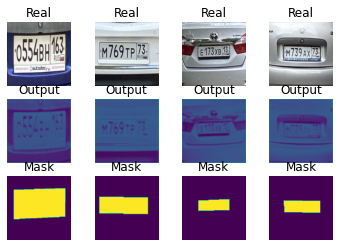

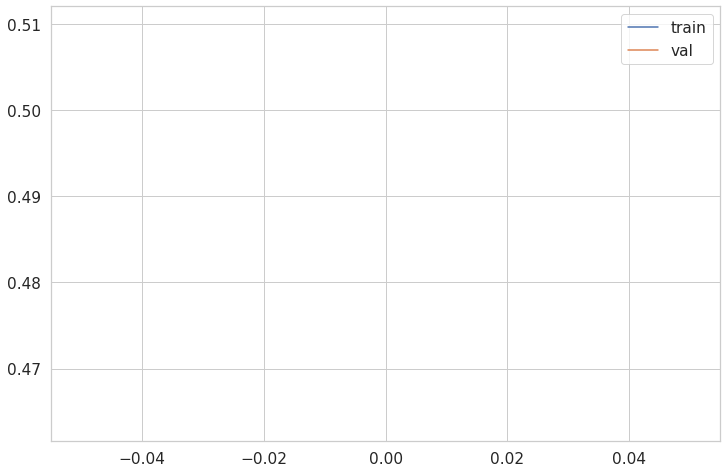

{'train': [0.4638361930847168], 'val': [0.509788990020752], 'score': [1.5825289212748062e-12]}
upgraded-plate-mask.pt
* Epoch 2/100
loss: 0.223799
Y_hat= (20, 1, 256, 256)
Score= 0.048900142312049866


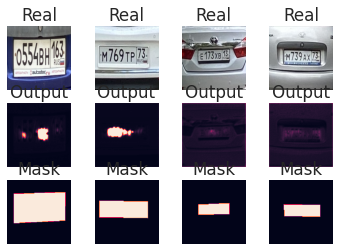

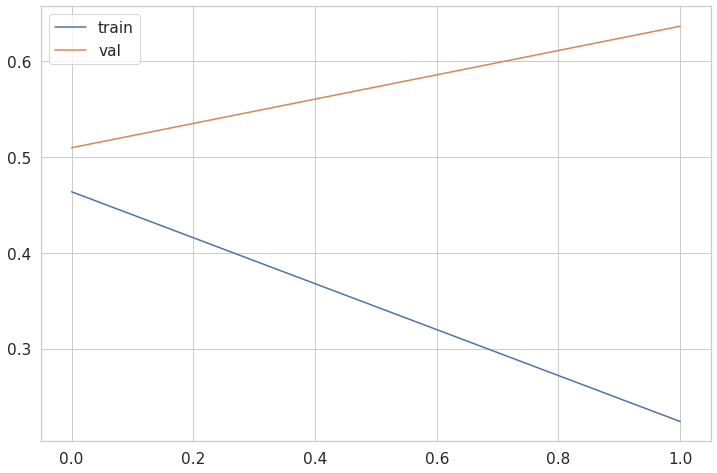

{'train': [0.4638361930847168, 0.22379903495311737], 'val': [0.509788990020752, 0.6367778778076172], 'score': [1.5825289212748062e-12, 0.048900142312049866]}
upgraded-plate-mask.pt
* Epoch 3/100
loss: 0.141264
Y_hat= (20, 1, 256, 256)
Score= 0.4993303120136261


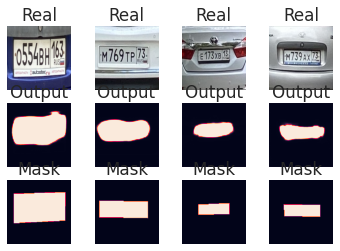

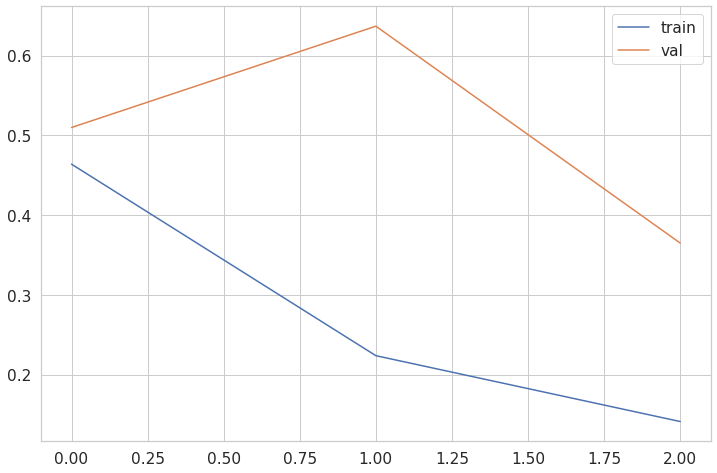

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474], 'val': [0.509788990020752, 0.6367778778076172, 0.3649303913116455], 'score': [1.5825289212748062e-12, 0.048900142312049866, 0.4993303120136261]}
upgraded-plate-mask.pt
* Epoch 4/100
loss: 0.112002
Y_hat= (20, 1, 256, 256)
Score= 0.5999367237091064


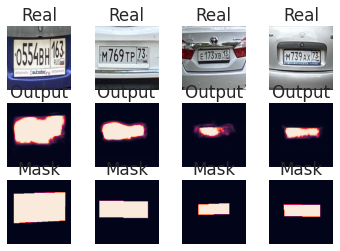

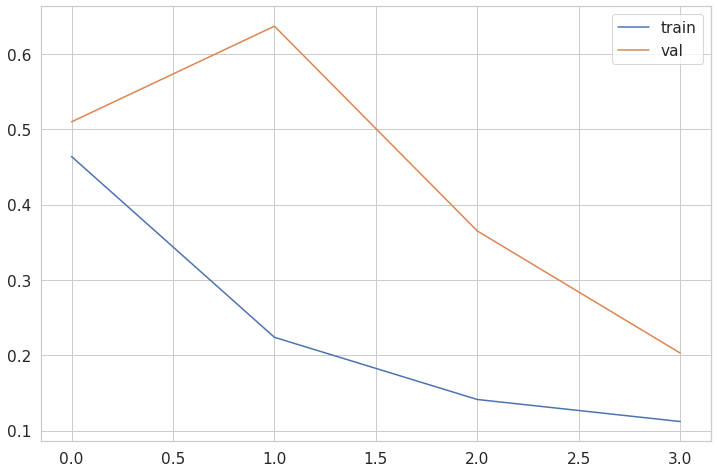

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474], 'val': [0.509788990020752, 0.6367778778076172, 0.3649303913116455, 0.202875554561615], 'score': [1.5825289212748062e-12, 0.048900142312049866, 0.4993303120136261, 0.5999367237091064]}
upgraded-plate-mask.pt
* Epoch 5/100
loss: 0.097746
Y_hat= (20, 1, 256, 256)
Score= 0.7508650422096252


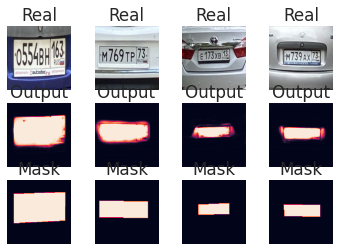

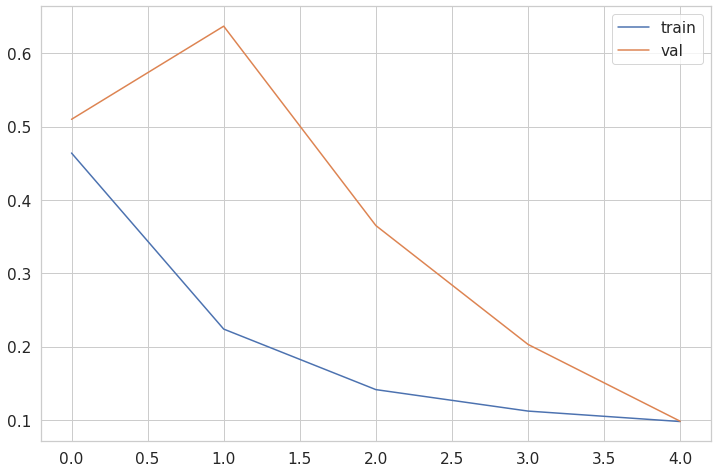

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756], 'val': [0.509788990020752, 0.6367778778076172, 0.3649303913116455, 0.202875554561615, 0.0981171578168869], 'score': [1.5825289212748062e-12, 0.048900142312049866, 0.4993303120136261, 0.5999367237091064, 0.7508650422096252]}
upgraded-plate-mask.pt
* Epoch 6/100
loss: 0.080249
Y_hat= (20, 1, 256, 256)
Score= 0.8277849555015564


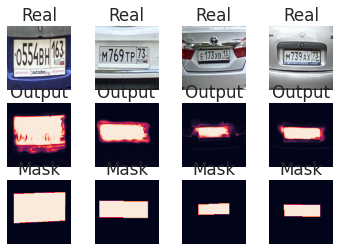

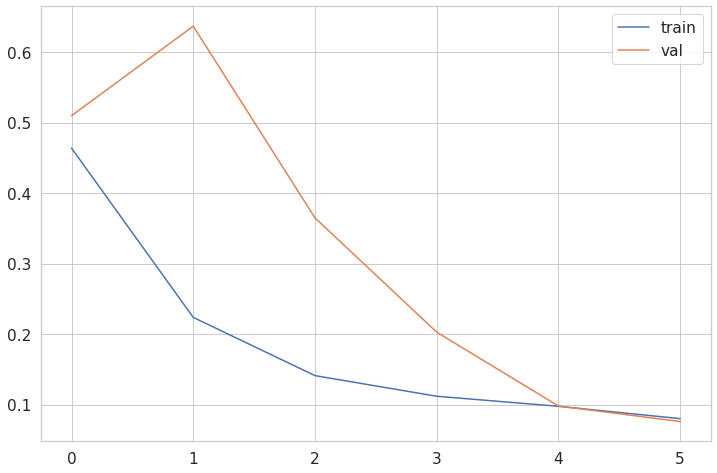

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925], 'val': [0.509788990020752, 0.6367778778076172, 0.3649303913116455, 0.202875554561615, 0.0981171578168869, 0.07615668326616287], 'score': [1.5825289212748062e-12, 0.048900142312049866, 0.4993303120136261, 0.5999367237091064, 0.7508650422096252, 0.8277849555015564]}
upgraded-plate-mask.pt
* Epoch 7/100
loss: 0.063389
Y_hat= (20, 1, 256, 256)
Score= 0.8085769414901733


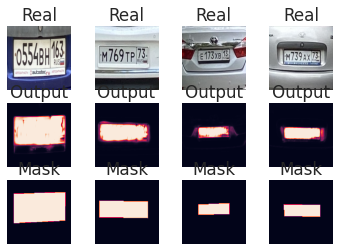

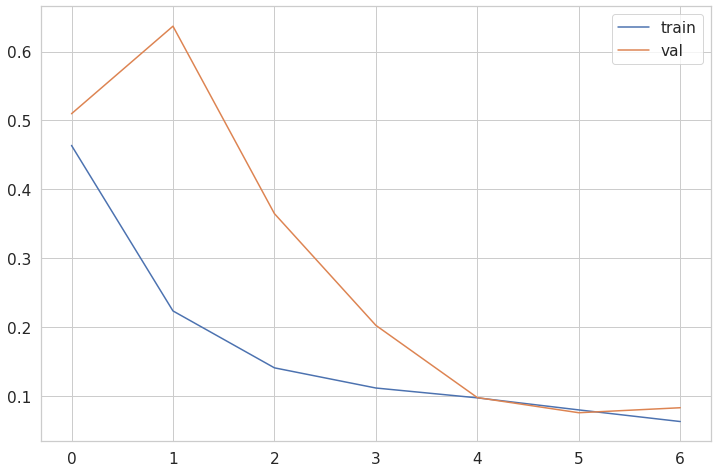

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375], 'val': [0.509788990020752, 0.6367778778076172, 0.3649303913116455, 0.202875554561615, 0.0981171578168869, 0.07615668326616287, 0.08340241014957428], 'score': [1.5825289212748062e-12, 0.048900142312049866, 0.4993303120136261, 0.5999367237091064, 0.7508650422096252, 0.8277849555015564, 0.8085769414901733]}
upgraded-plate-mask.pt
* Epoch 8/100
loss: 0.054012
Y_hat= (20, 1, 256, 256)
Score= 0.7187312245368958


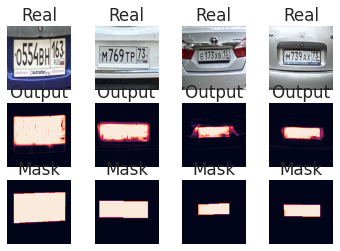

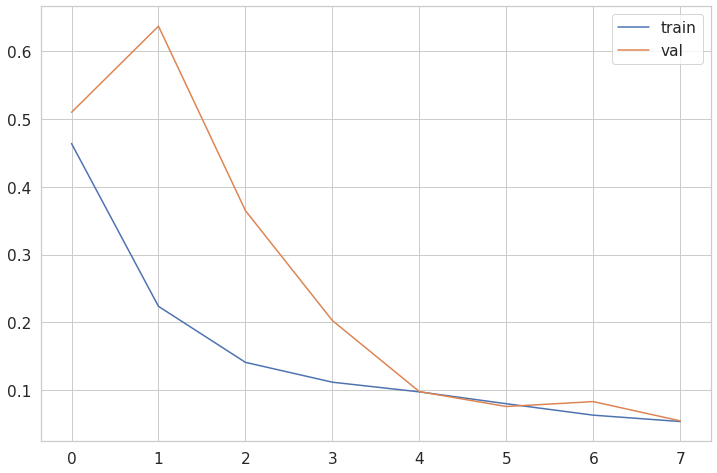

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104], 'val': [0.509788990020752, 0.6367778778076172, 0.3649303913116455, 0.202875554561615, 0.0981171578168869, 0.07615668326616287, 0.08340241014957428, 0.05498453974723816], 'score': [1.5825289212748062e-12, 0.048900142312049866, 0.4993303120136261, 0.5999367237091064, 0.7508650422096252, 0.8277849555015564, 0.8085769414901733, 0.7187312245368958]}
upgraded-plate-mask.pt
* Epoch 9/100
loss: 0.048190
Y_hat= (20, 1, 256, 256)
Score= 0.8022218942642212


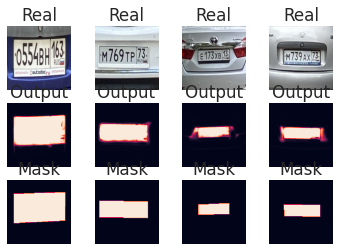

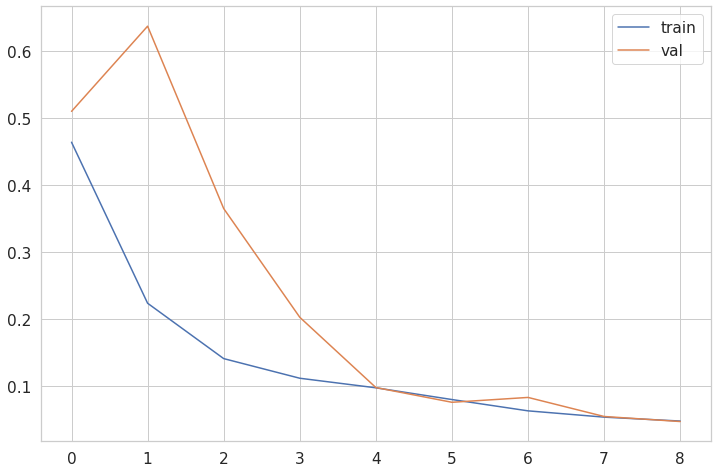

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154], 'val': [0.509788990020752, 0.6367778778076172, 0.3649303913116455, 0.202875554561615, 0.0981171578168869, 0.07615668326616287, 0.08340241014957428, 0.05498453974723816, 0.04746999219059944], 'score': [1.5825289212748062e-12, 0.048900142312049866, 0.4993303120136261, 0.5999367237091064, 0.7508650422096252, 0.8277849555015564, 0.8085769414901733, 0.7187312245368958, 0.8022218942642212]}
upgraded-plate-mask.pt
* Epoch 10/100
loss: 0.053160
Y_hat= (20, 1, 256, 256)
Score= 0.7716776132583618


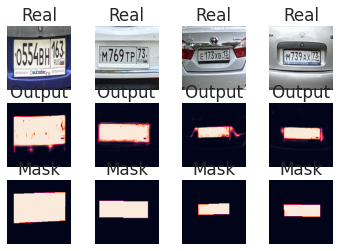

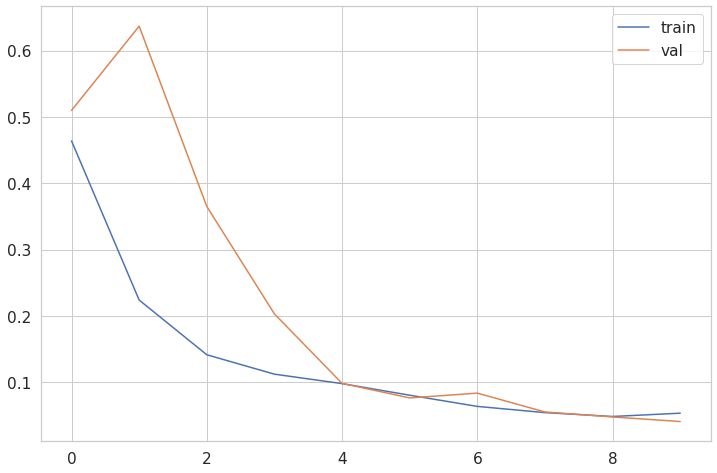

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406], 'val': [0.509788990020752, 0.6367778778076172, 0.3649303913116455, 0.202875554561615, 0.0981171578168869, 0.07615668326616287, 0.08340241014957428, 0.05498453974723816, 0.04746999219059944, 0.04056233912706375], 'score': [1.5825289212748062e-12, 0.048900142312049866, 0.4993303120136261, 0.5999367237091064, 0.7508650422096252, 0.8277849555015564, 0.8085769414901733, 0.7187312245368958, 0.8022218942642212, 0.7716776132583618]}
upgraded-plate-mask.pt
* Epoch 11/100
loss: 0.058533
Y_hat= (20, 1, 256, 256)
Score= 0.6137703657150269


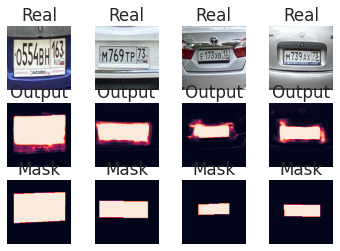

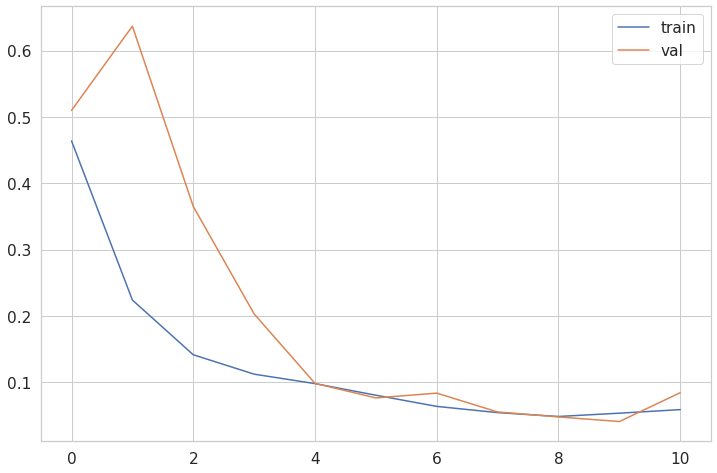

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665], 'val': [0.509788990020752, 0.6367778778076172, 0.3649303913116455, 0.202875554561615, 0.0981171578168869, 0.07615668326616287, 0.08340241014957428, 0.05498453974723816, 0.04746999219059944, 0.04056233912706375, 0.08404026180505753], 'score': [1.5825289212748062e-12, 0.048900142312049866, 0.4993303120136261, 0.5999367237091064, 0.7508650422096252, 0.8277849555015564, 0.8085769414901733, 0.7187312245368958, 0.8022218942642212, 0.7716776132583618, 0.6137703657150269]}
upgraded-plate-mask.pt
* Epoch 12/100
loss: 0.047531
Y_hat= (20, 1, 256, 256)
Score= 0.8680053353309631


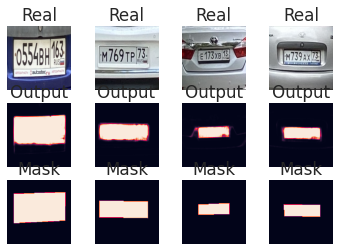

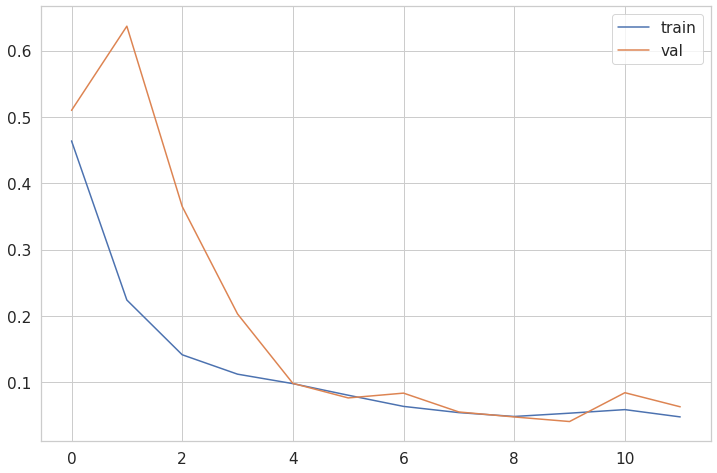

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855], 'val': [0.509788990020752, 0.6367778778076172, 0.3649303913116455, 0.202875554561615, 0.0981171578168869, 0.07615668326616287, 0.08340241014957428, 0.05498453974723816, 0.04746999219059944, 0.04056233912706375, 0.08404026180505753, 0.06276500225067139], 'score': [1.5825289212748062e-12, 0.048900142312049866, 0.4993303120136261, 0.5999367237091064, 0.7508650422096252, 0.8277849555015564, 0.8085769414901733, 0.7187312245368958, 0.8022218942642212, 0.7716776132583618, 0.6137703657150269, 0.8680053353309631]}
upgraded-plate-mask.pt
* Epoch 13/100
loss: 0.038985
Y_hat= (20, 1, 256, 256)
Score= 0.9101123809814453


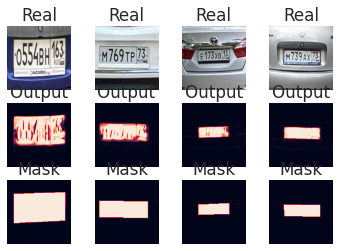

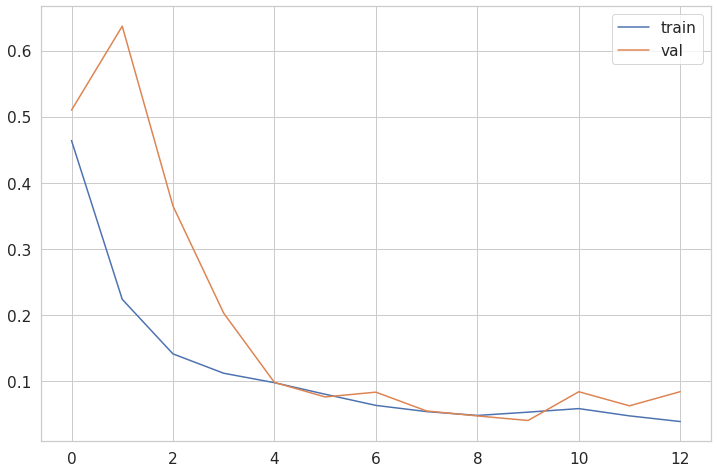

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528], 'val': [0.509788990020752, 0.6367778778076172, 0.3649303913116455, 0.202875554561615, 0.0981171578168869, 0.07615668326616287, 0.08340241014957428, 0.05498453974723816, 0.04746999219059944, 0.04056233912706375, 0.08404026180505753, 0.06276500225067139, 0.08414033055305481], 'score': [1.5825289212748062e-12, 0.048900142312049866, 0.4993303120136261, 0.5999367237091064, 0.7508650422096252, 0.8277849555015564, 0.8085769414901733, 0.7187312245368958, 0.8022218942642212, 0.7716776132583618, 0.6137703657150269, 0.8680053353309631, 0.9101123809814453]}
upgraded-plate-mask.pt
* Epoch 14/100
loss: 0.033127
Y_hat= (20, 1, 256, 256)
Score= 0.8816901445388794


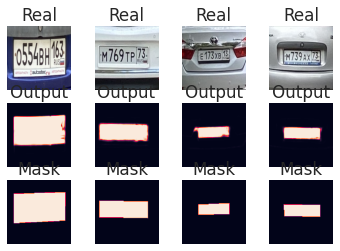

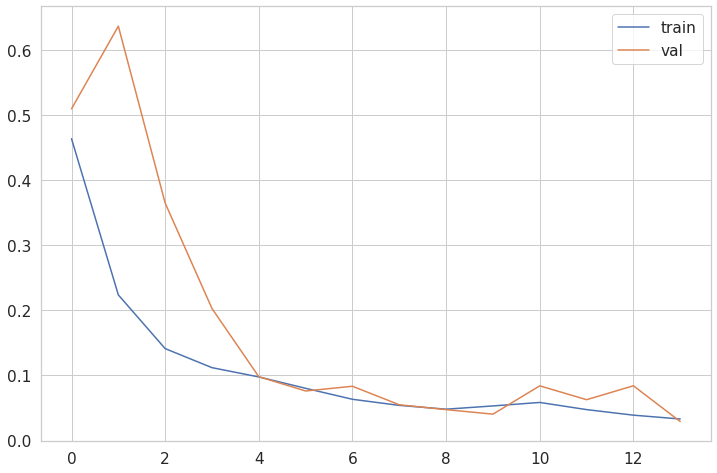

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885], 'val': [0.509788990020752, 0.6367778778076172, 0.3649303913116455, 0.202875554561615, 0.0981171578168869, 0.07615668326616287, 0.08340241014957428, 0.05498453974723816, 0.04746999219059944, 0.04056233912706375, 0.08404026180505753, 0.06276500225067139, 0.08414033055305481, 0.029201503843069077], 'score': [1.5825289212748062e-12, 0.048900142312049866, 0.4993303120136261, 0.5999367237091064, 0.7508650422096252, 0.8277849555015564, 0.8085769414901733, 0.7187312245368958, 0.8022218942642212, 0.7716776132583618, 0.6137703657150269, 0.8680053353309631, 0.9101123809814453, 0.8816901445388794]}
upgraded-plate-mask.pt
* Epoch 15/100
loss: 0.033173
Y_hat= (20, 1, 256, 256)
Score= 0.75755655765

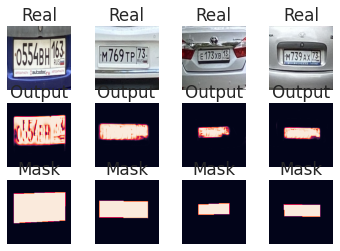

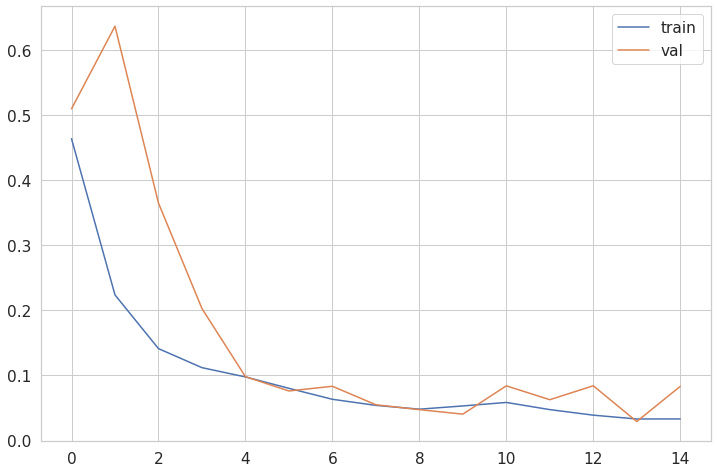

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738], 'val': [0.509788990020752, 0.6367778778076172, 0.3649303913116455, 0.202875554561615, 0.0981171578168869, 0.07615668326616287, 0.08340241014957428, 0.05498453974723816, 0.04746999219059944, 0.04056233912706375, 0.08404026180505753, 0.06276500225067139, 0.08414033055305481, 0.029201503843069077, 0.08325406908988953], 'score': [1.5825289212748062e-12, 0.048900142312049866, 0.4993303120136261, 0.5999367237091064, 0.7508650422096252, 0.8277849555015564, 0.8085769414901733, 0.7187312245368958, 0.8022218942642212, 0.7716776132583618, 0.6137703657150269, 0.8680053353309631, 0.9101123809814453, 0.8816901445388794, 0.7575565576553345]}
upgraded-plate-mask.pt
* Epoch 16/10

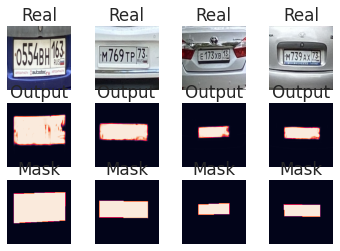

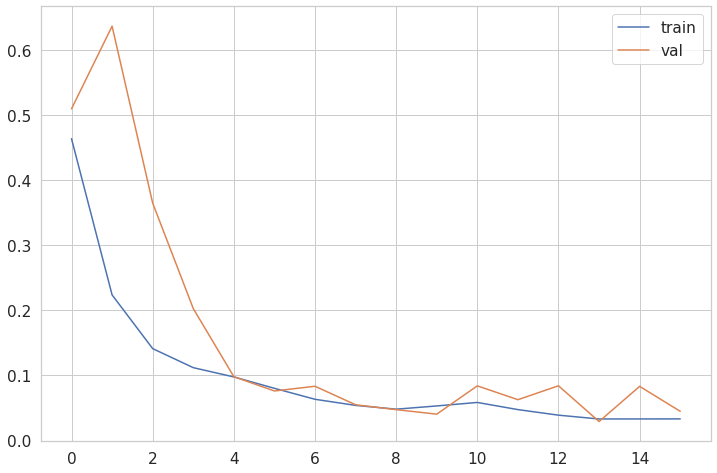

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916], 'val': [0.509788990020752, 0.6367778778076172, 0.3649303913116455, 0.202875554561615, 0.0981171578168869, 0.07615668326616287, 0.08340241014957428, 0.05498453974723816, 0.04746999219059944, 0.04056233912706375, 0.08404026180505753, 0.06276500225067139, 0.08414033055305481, 0.029201503843069077, 0.08325406908988953, 0.04488402232527733], 'score': [1.5825289212748062e-12, 0.048900142312049866, 0.4993303120136261, 0.5999367237091064, 0.7508650422096252, 0.8277849555015564, 0.8085769414901733, 0.7187312245368958, 0.8022218942642212, 0.7716776132583618, 0.6137703657150269, 0.8680053353309631, 0.9101123809814453, 0.8816901445388794, 0.757556557655

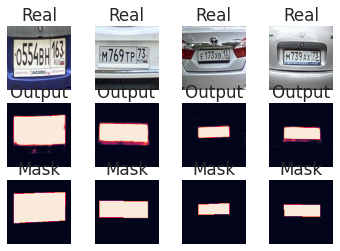

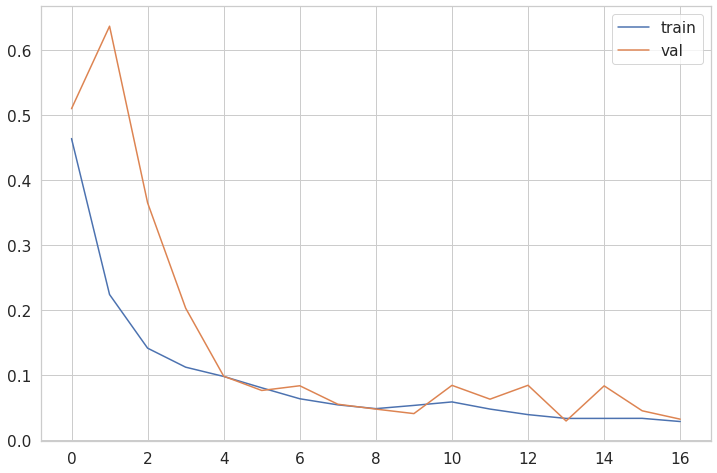

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732], 'val': [0.509788990020752, 0.6367778778076172, 0.3649303913116455, 0.202875554561615, 0.0981171578168869, 0.07615668326616287, 0.08340241014957428, 0.05498453974723816, 0.04746999219059944, 0.04056233912706375, 0.08404026180505753, 0.06276500225067139, 0.08414033055305481, 0.029201503843069077, 0.08325406908988953, 0.04488402232527733, 0.03197389096021652], 'score': [1.5825289212748062e-12, 0.048900142312049866, 0.4993303120136261, 0.5999367237091064, 0.7508650422096252, 0.8277849555015564, 0.8085769414901733, 0.7187312245368958, 0.8022218942642212, 0.7716776132583618, 0.6137703657150269, 0.8680053353309631, 0.910112380

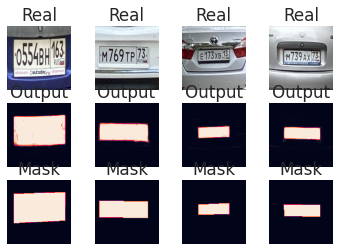

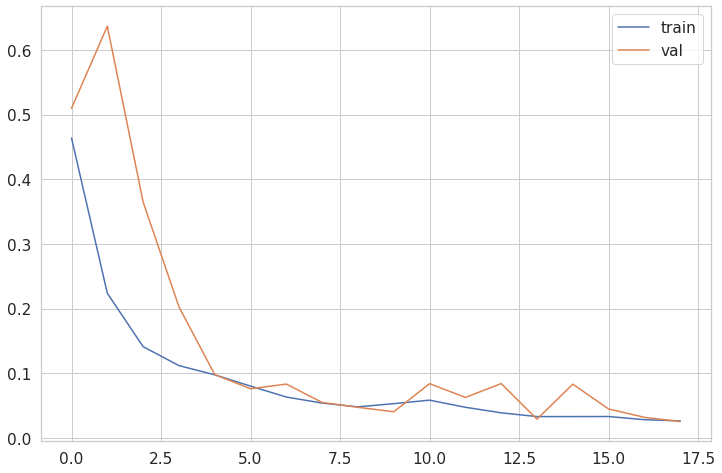

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177], 'val': [0.509788990020752, 0.6367778778076172, 0.3649303913116455, 0.202875554561615, 0.0981171578168869, 0.07615668326616287, 0.08340241014957428, 0.05498453974723816, 0.04746999219059944, 0.04056233912706375, 0.08404026180505753, 0.06276500225067139, 0.08414033055305481, 0.029201503843069077, 0.08325406908988953, 0.04488402232527733, 0.03197389096021652, 0.025499524548649788], 'score': [1.5825289212748062e-12, 0.048900142312049866, 0.4993303120136261, 0.5999367237091064, 0.7508650422096252, 0.8277849555015564, 0.8085769414901733, 0.7187312245368958, 0.8022218942642212, 0.7716776132583618, 0.613770

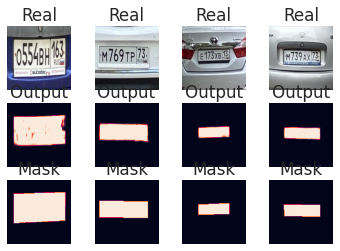

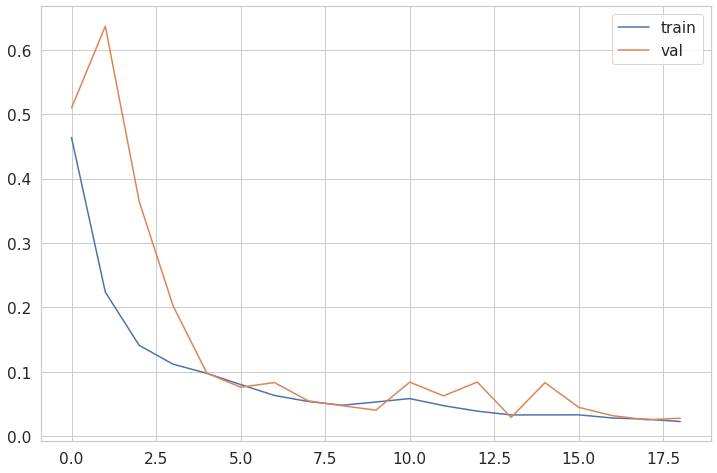

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313], 'val': [0.509788990020752, 0.6367778778076172, 0.3649303913116455, 0.202875554561615, 0.0981171578168869, 0.07615668326616287, 0.08340241014957428, 0.05498453974723816, 0.04746999219059944, 0.04056233912706375, 0.08404026180505753, 0.06276500225067139, 0.08414033055305481, 0.029201503843069077, 0.08325406908988953, 0.04488402232527733, 0.03197389096021652, 0.025499524548649788, 0.0280607920140028], 'score': [1.5825289212748062e-12, 0.048900142312049866, 0.4993303120136261, 0.5999367237091064, 0.7508650422096252, 0.8277849555015564, 0.8085769414901733, 0.7187312245368958, 0.8022

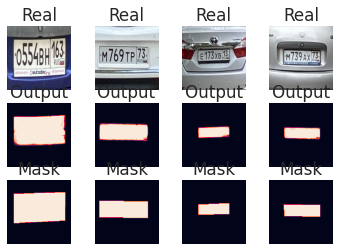

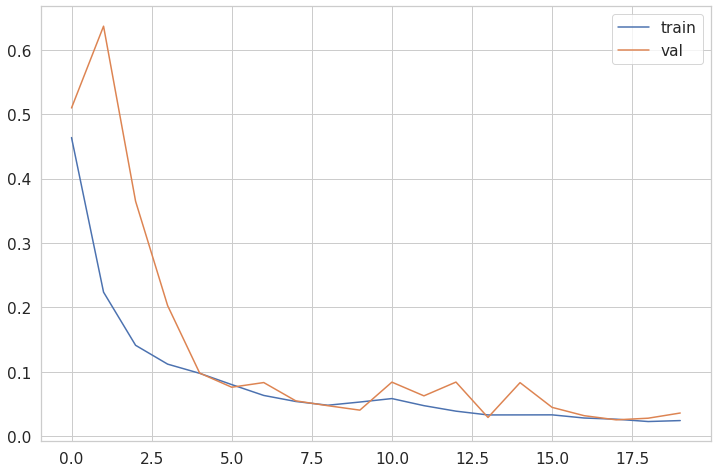

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089], 'val': [0.509788990020752, 0.6367778778076172, 0.3649303913116455, 0.202875554561615, 0.0981171578168869, 0.07615668326616287, 0.08340241014957428, 0.05498453974723816, 0.04746999219059944, 0.04056233912706375, 0.08404026180505753, 0.06276500225067139, 0.08414033055305481, 0.029201503843069077, 0.08325406908988953, 0.04488402232527733, 0.03197389096021652, 0.025499524548649788, 0.0280607920140028, 0.03611446171998978], 'score': [1.5825289212748062e-12, 0.048900142312049866, 0.4993303120136261, 0.5999367237091064, 0.7508650422096252, 0.8277849555015564, 0.80

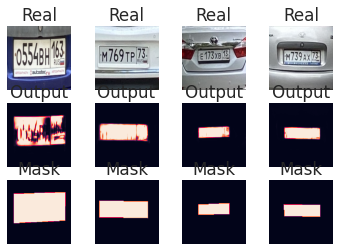

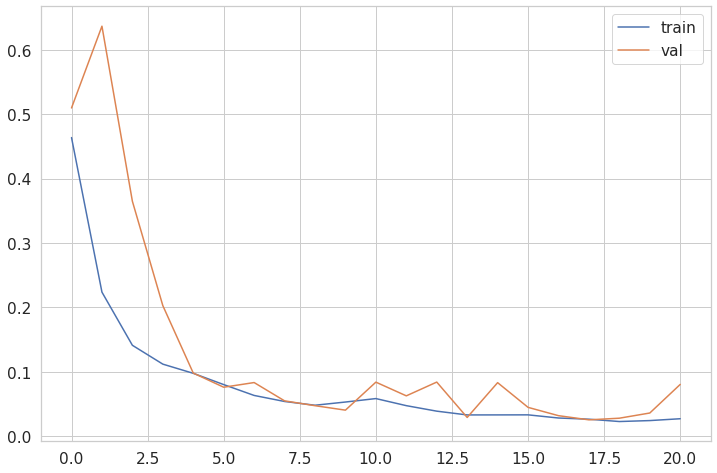

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832], 'val': [0.509788990020752, 0.6367778778076172, 0.3649303913116455, 0.202875554561615, 0.0981171578168869, 0.07615668326616287, 0.08340241014957428, 0.05498453974723816, 0.04746999219059944, 0.04056233912706375, 0.08404026180505753, 0.06276500225067139, 0.08414033055305481, 0.029201503843069077, 0.08325406908988953, 0.04488402232527733, 0.03197389096021652, 0.025499524548649788, 0.0280607920140028, 0.03611446171998978, 0.08053800463676453], 'score': [1.5825289212748062e-12, 0.048900142312049866, 0.4993303120136261, 0.5999367237091064, 0

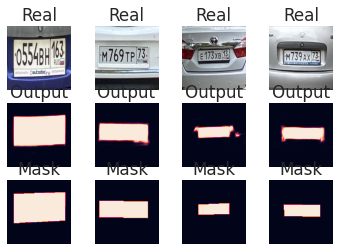

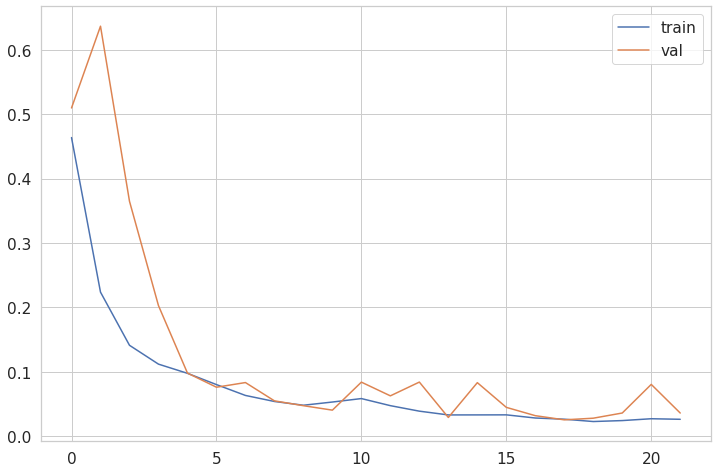

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782], 'val': [0.509788990020752, 0.6367778778076172, 0.3649303913116455, 0.202875554561615, 0.0981171578168869, 0.07615668326616287, 0.08340241014957428, 0.05498453974723816, 0.04746999219059944, 0.04056233912706375, 0.08404026180505753, 0.06276500225067139, 0.08414033055305481, 0.029201503843069077, 0.08325406908988953, 0.04488402232527733, 0.03197389096021652, 0.025499524548649788, 0.0280607920140028, 0.03611446171998978, 0.08053800463676453, 0.03606041520833969], 'score': [1.5825289212748062e-12, 0.048900142312049866

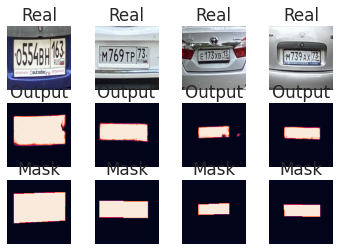

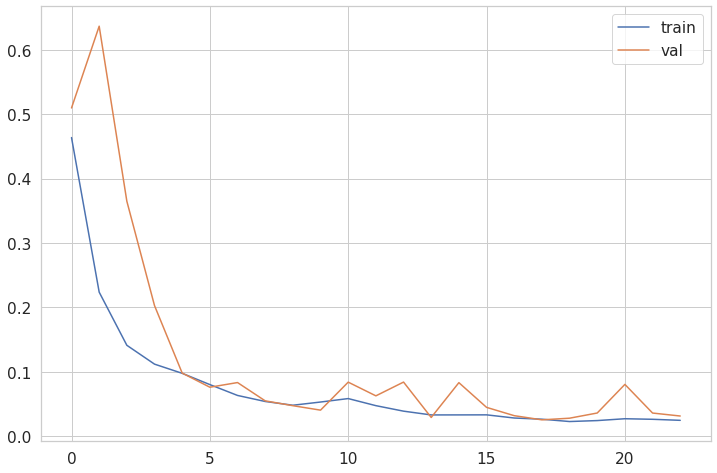

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822], 'val': [0.509788990020752, 0.6367778778076172, 0.3649303913116455, 0.202875554561615, 0.0981171578168869, 0.07615668326616287, 0.08340241014957428, 0.05498453974723816, 0.04746999219059944, 0.04056233912706375, 0.08404026180505753, 0.06276500225067139, 0.08414033055305481, 0.029201503843069077, 0.08325406908988953, 0.04488402232527733, 0.03197389096021652, 0.025499524548649788, 0.0280607920140028, 0.03611446171998978, 0.08053800463676453, 0.03606041520833969, 0.03144765645265579], 'score': [1.5

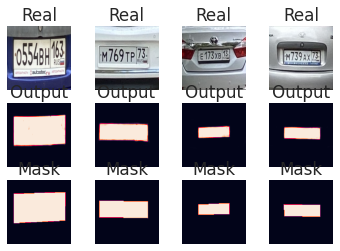

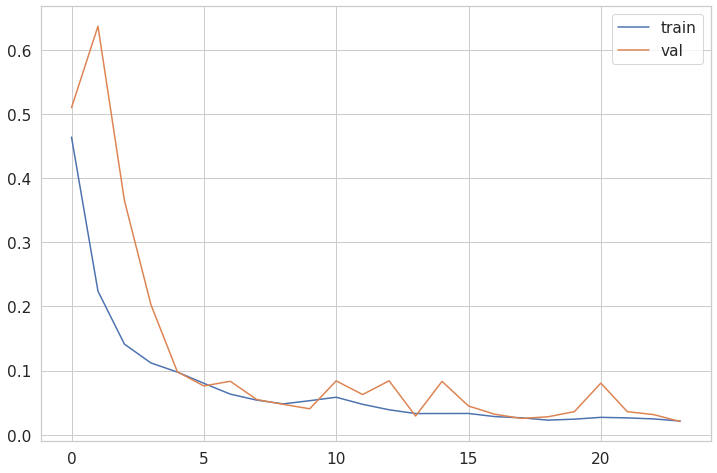

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357], 'val': [0.509788990020752, 0.6367778778076172, 0.3649303913116455, 0.202875554561615, 0.0981171578168869, 0.07615668326616287, 0.08340241014957428, 0.05498453974723816, 0.04746999219059944, 0.04056233912706375, 0.08404026180505753, 0.06276500225067139, 0.08414033055305481, 0.029201503843069077, 0.08325406908988953, 0.04488402232527733, 0.03197389096021652, 0.025499524548649788, 0.0280607920140028, 0.03611446171998978, 0.08053800463676453, 0.03606041520833969, 0.03144765645

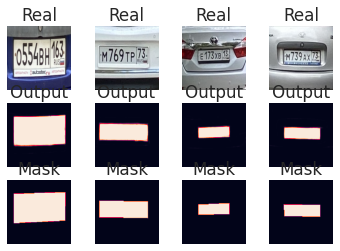

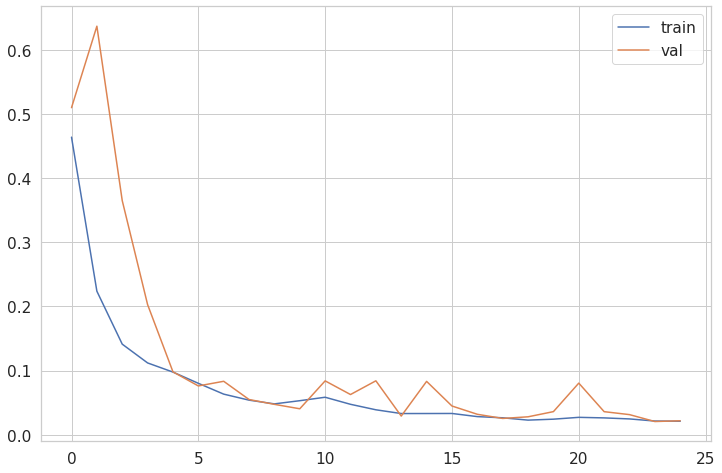

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738], 'val': [0.509788990020752, 0.6367778778076172, 0.3649303913116455, 0.202875554561615, 0.0981171578168869, 0.07615668326616287, 0.08340241014957428, 0.05498453974723816, 0.04746999219059944, 0.04056233912706375, 0.08404026180505753, 0.06276500225067139, 0.08414033055305481, 0.029201503843069077, 0.08325406908988953, 0.04488402232527733, 0.03197389096021652, 0.025499524548649788, 0.0280607920140028, 0.03611446171998978, 0.08053800463676453, 0.0360604152

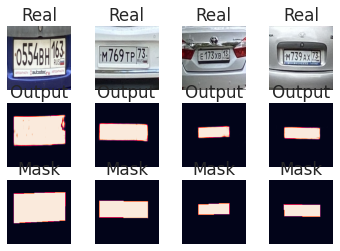

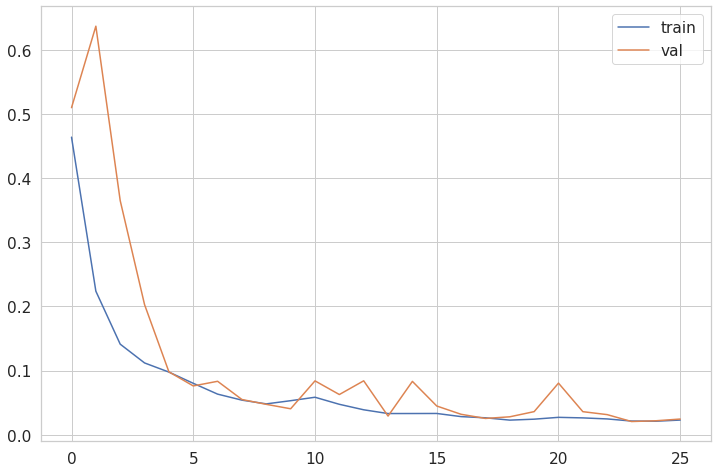

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135], 'val': [0.509788990020752, 0.6367778778076172, 0.3649303913116455, 0.202875554561615, 0.0981171578168869, 0.07615668326616287, 0.08340241014957428, 0.05498453974723816, 0.04746999219059944, 0.04056233912706375, 0.08404026180505753, 0.06276500225067139, 0.08414033055305481, 0.029201503843069077, 0.08325406908988953, 0.04488402232527733, 0.03197389096021652, 0.025499524548649788, 0.0280607920140028, 0.03611446171998978, 0.080538004

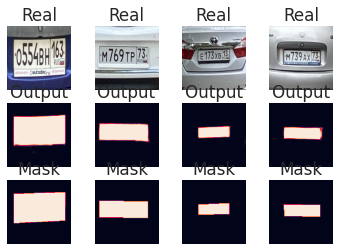

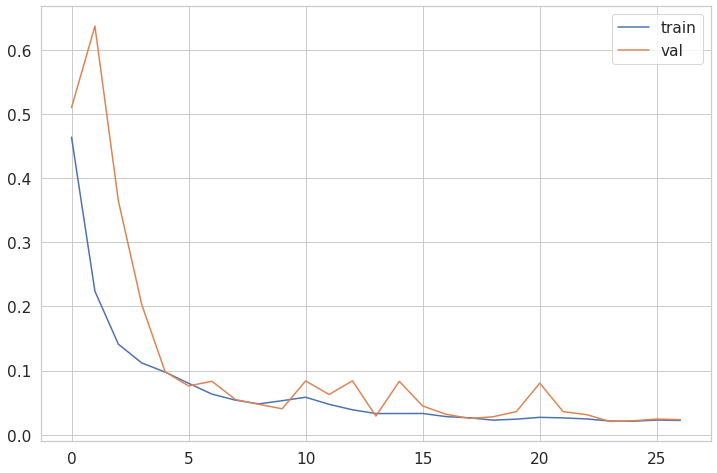

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406], 'val': [0.509788990020752, 0.6367778778076172, 0.3649303913116455, 0.202875554561615, 0.0981171578168869, 0.07615668326616287, 0.08340241014957428, 0.05498453974723816, 0.04746999219059944, 0.04056233912706375, 0.08404026180505753, 0.06276500225067139, 0.08414033055305481, 0.029201503843069077, 0.08325406908988953, 0.04488402232527733, 0.03197389096021652, 0.025499524548649788, 0.0280607920140028, 0.03611446

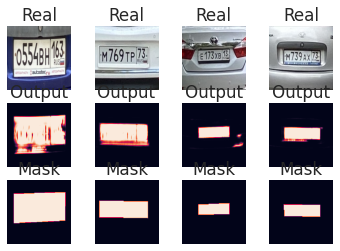

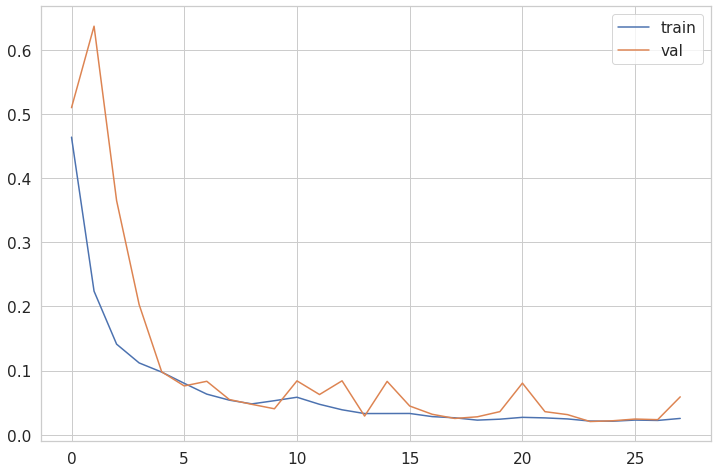

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104], 'val': [0.509788990020752, 0.6367778778076172, 0.3649303913116455, 0.202875554561615, 0.0981171578168869, 0.07615668326616287, 0.08340241014957428, 0.05498453974723816, 0.04746999219059944, 0.04056233912706375, 0.08404026180505753, 0.06276500225067139, 0.08414033055305481, 0.029201503843069077, 0.08325406908988953, 0.04488402232527733, 0.03197389096021652, 0.025499524548649788, 0.028060

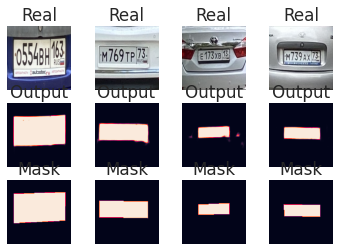

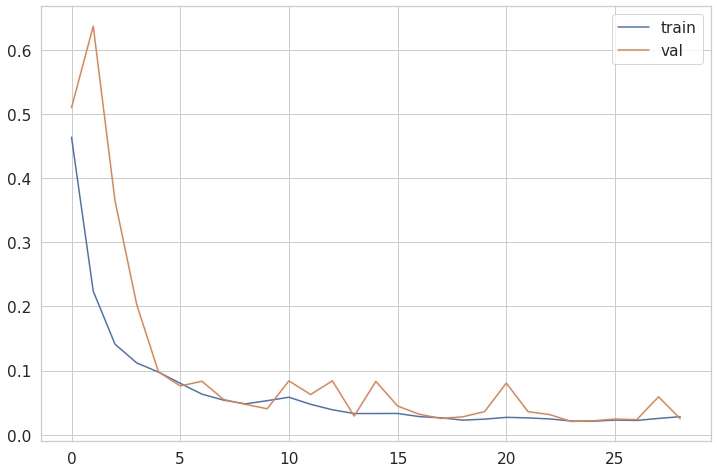

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529], 'val': [0.509788990020752, 0.6367778778076172, 0.3649303913116455, 0.202875554561615, 0.0981171578168869, 0.07615668326616287, 0.08340241014957428, 0.05498453974723816, 0.04746999219059944, 0.04056233912706375, 0.08404026180505753, 0.06276500225067139, 0.08414033055305481, 0.029201503843069077, 0.08325406908988953, 0.04488402232527733, 0.03197389096021652, 0.0254995

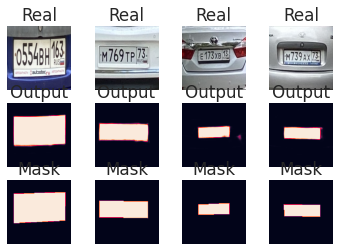

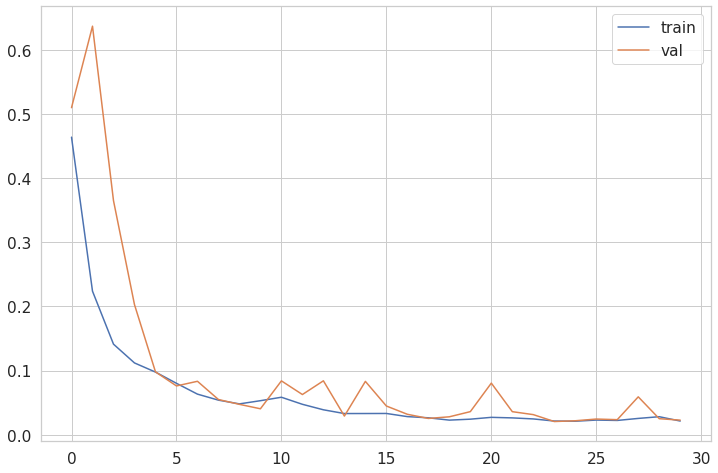

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658], 'val': [0.509788990020752, 0.6367778778076172, 0.3649303913116455, 0.202875554561615, 0.0981171578168869, 0.07615668326616287, 0.08340241014957428, 0.05498453974723816, 0.04746999219059944, 0.04056233912706375, 0.08404026180505753, 0.06276500225067139, 0.08414033055305481, 0.029201503843069077, 0.08325406908988953, 0.04488402232527733, 0.031973

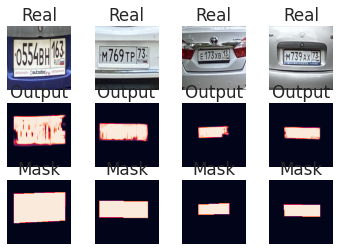

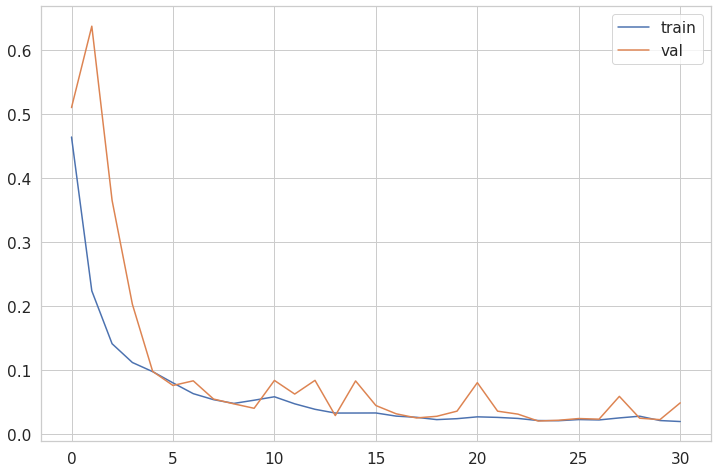

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002], 'val': [0.509788990020752, 0.6367778778076172, 0.3649303913116455, 0.202875554561615, 0.0981171578168869, 0.07615668326616287, 0.08340241014957428, 0.05498453974723816, 0.04746999219059944, 0.04056233912706375, 0.08404026180505753, 0.06276500225067139, 0.08414033055305481, 0.029201503843069077, 0.08325406908988953, 0.044884

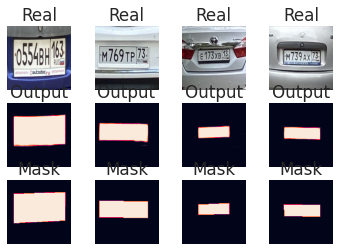

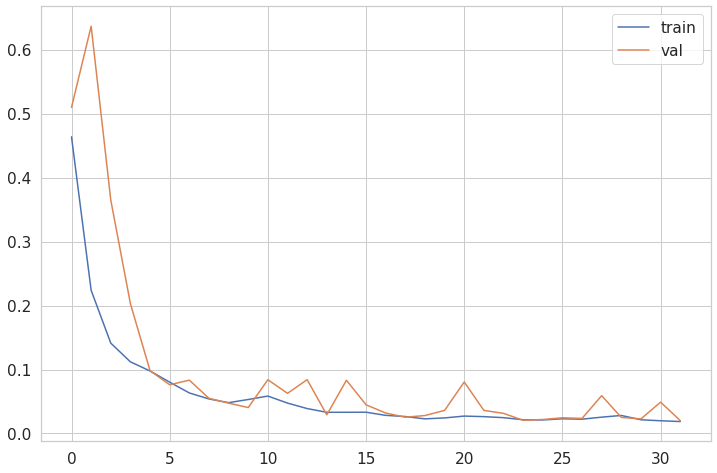

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599], 'val': [0.509788990020752, 0.6367778778076172, 0.3649303913116455, 0.202875554561615, 0.0981171578168869, 0.07615668326616287, 0.08340241014957428, 0.05498453974723816, 0.04746999219059944, 0.04056233912706375, 0.08404026180505753, 0.06276500225067139, 0.08414033055305481, 0.029201503843069077, 0.083254

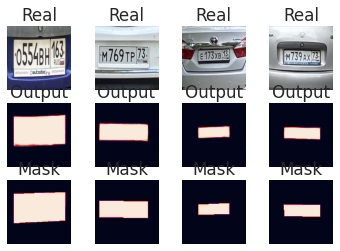

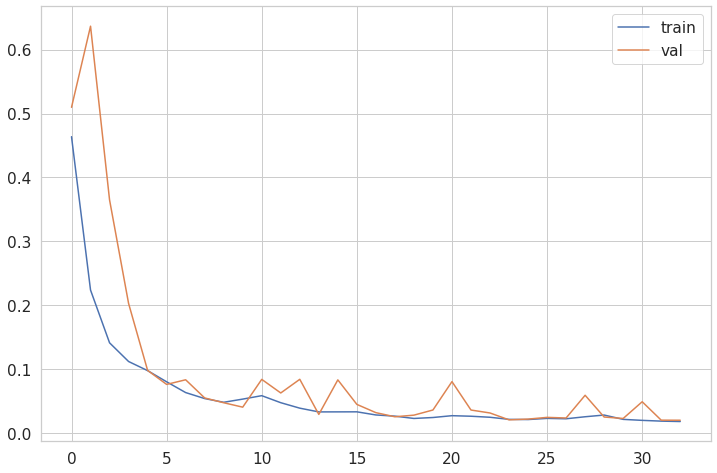

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603], 'val': [0.509788990020752, 0.6367778778076172, 0.3649303913116455, 0.202875554561615, 0.0981171578168869, 0.07615668326616287, 0.08340241014957428, 0.05498453974723816, 0.04746999219059944, 0.04056233912706375, 0.08404026180505753, 0.06276500225067139, 0.08414033055305481, 0.0292015

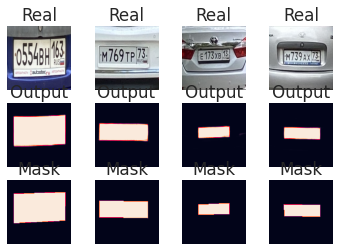

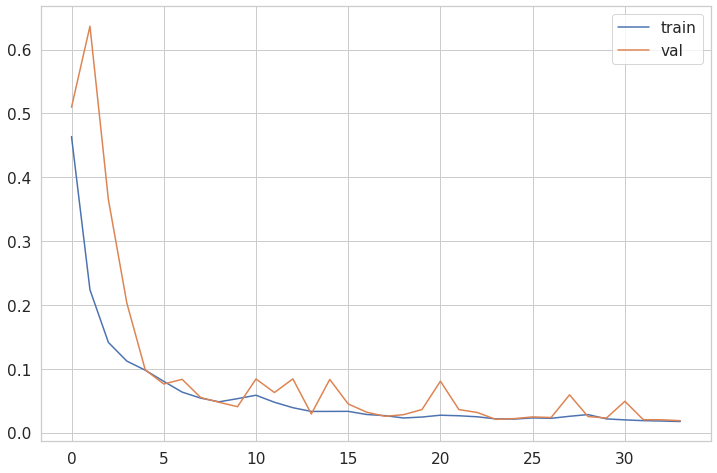

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744], 'val': [0.509788990020752, 0.6367778778076172, 0.3649303913116455, 0.202875554561615, 0.0981171578168869, 0.07615668326616287, 0.08340241014957428, 0.05498453974723816, 0.04746999219059944, 0.04056233912706375, 0.08404026180505753, 0.06276500225067139, 0.084140

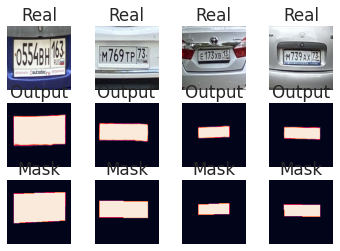

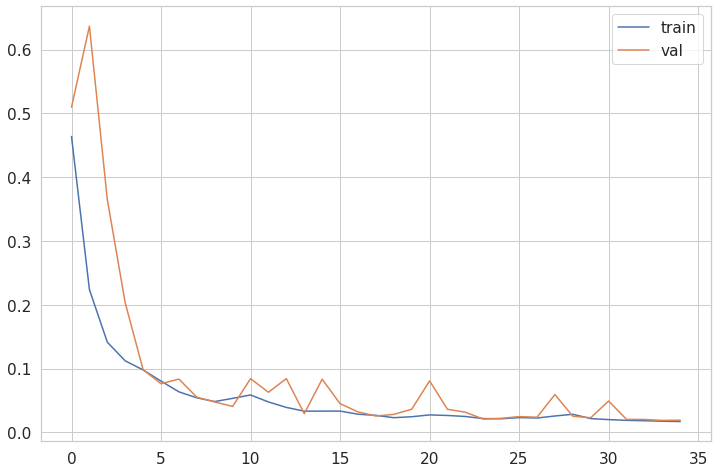

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564], 'val': [0.509788990020752, 0.6367778778076172, 0.3649303913116455, 0.202875554561615, 0.0981171578168869, 0.07615668326616287, 0.08340241014957428, 0.05498453974723816, 0.04746999219059944, 0.04056233912706375, 0.08404026180505753, 0.06276

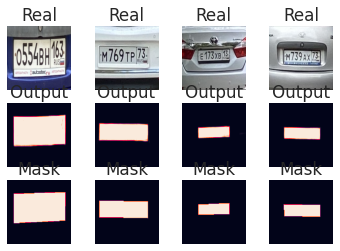

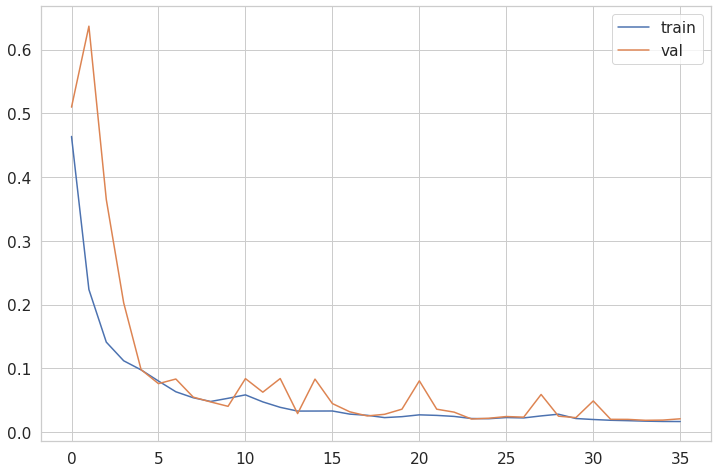

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815], 'val': [0.509788990020752, 0.6367778778076172, 0.3649303913116455, 0.202875554561615, 0.0981171578168869, 0.07615668326616287, 0.08340241014957428, 0.05498453974723816, 0.04746999219059944, 0.04056233912706375, 0.0840

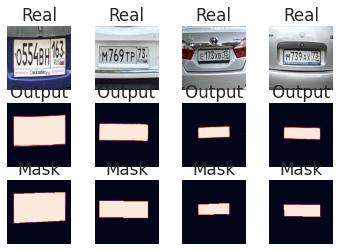

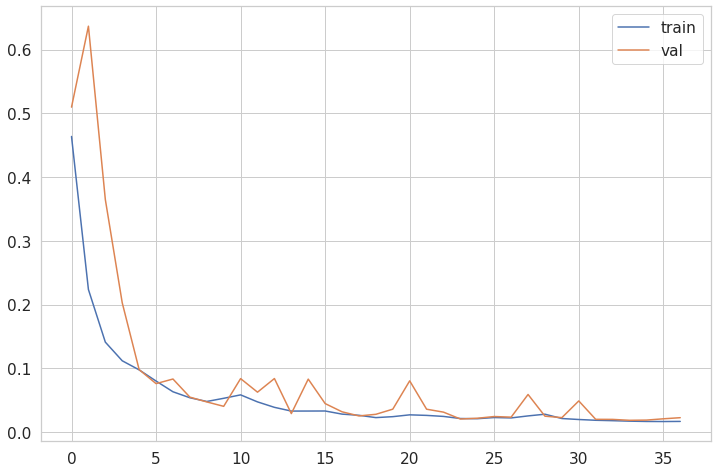

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343], 'val': [0.509788990020752, 0.6367778778076172, 0.3649303913116455, 0.202875554561615, 0.0981171578168869, 0.07615668326616287, 0.08340241014957428, 0.05498453974723816, 0.04746999219059944, 0.040

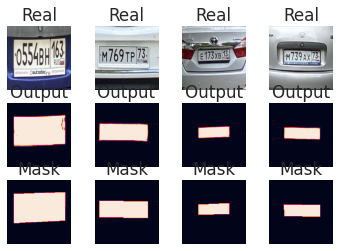

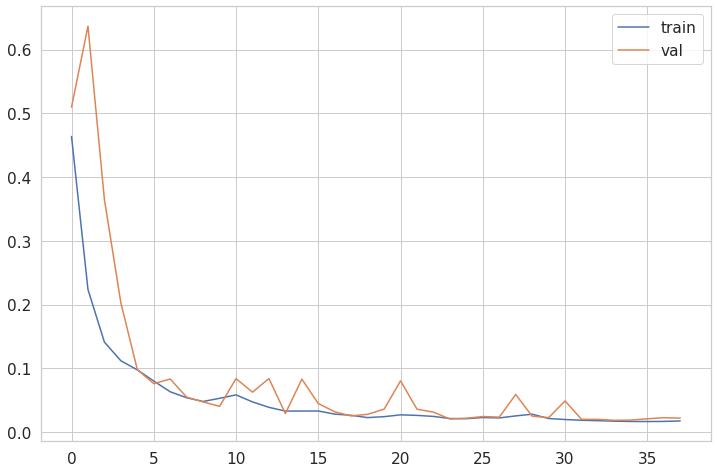

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378], 'val': [0.509788990020752, 0.6367778778076172, 0.3649303913116455, 0.202875554561615, 0.0981171578168869, 0.07615668326616287, 0.08340241014957428, 0.05498453974723816, 0.04

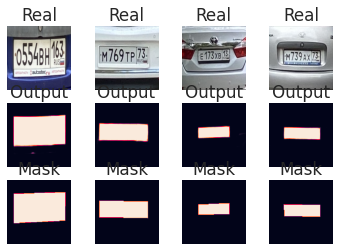

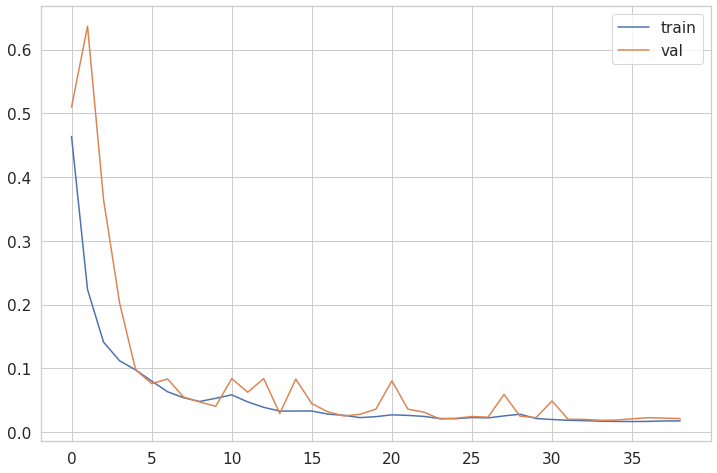

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313], 'val': [0.509788990020752, 0.6367778778076172, 0.3649303913116455, 0.202875554561615, 0.0981171578168869, 0.07615668326616287, 0.08340241014957428, 0.05

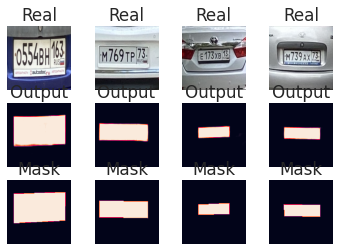

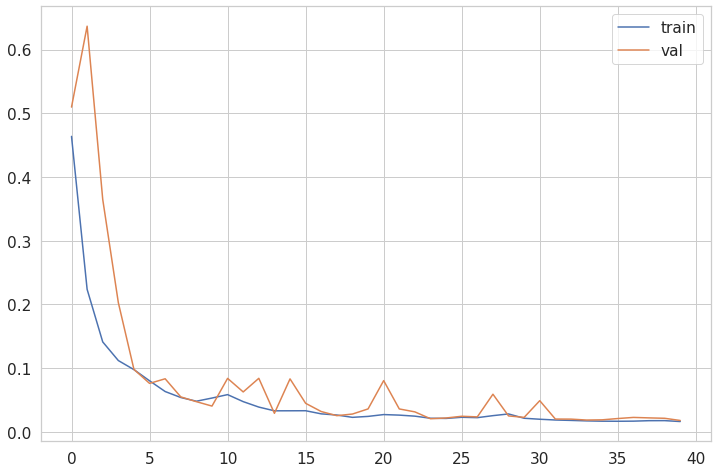

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176], 'val': [0.509788990020752, 0.6367778778076172, 0.3649303913116455, 0.202875554561615, 0.0981171578168869, 0.07615668326616287, 0.0

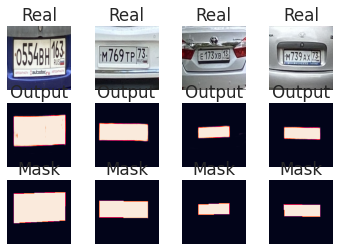

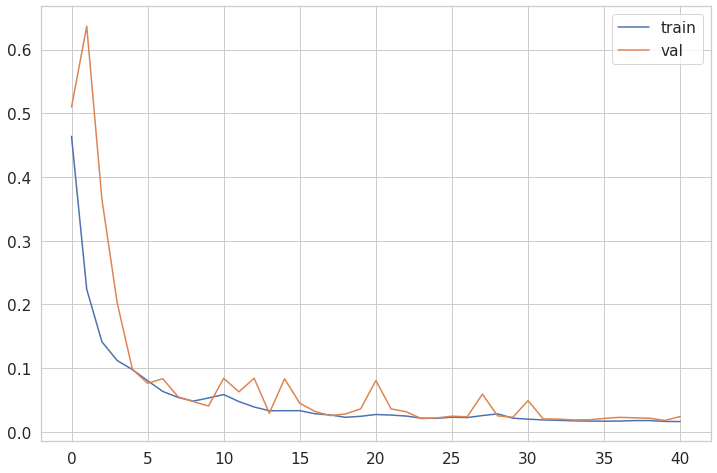

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994], 'val': [0.509788990020752, 0.6367778778076172, 0.3649303913116455, 0.202875554561615, 0.0981171578168869, 0.

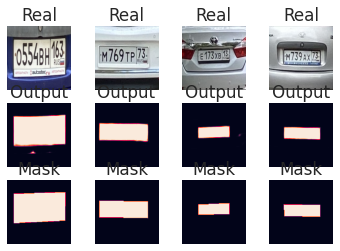

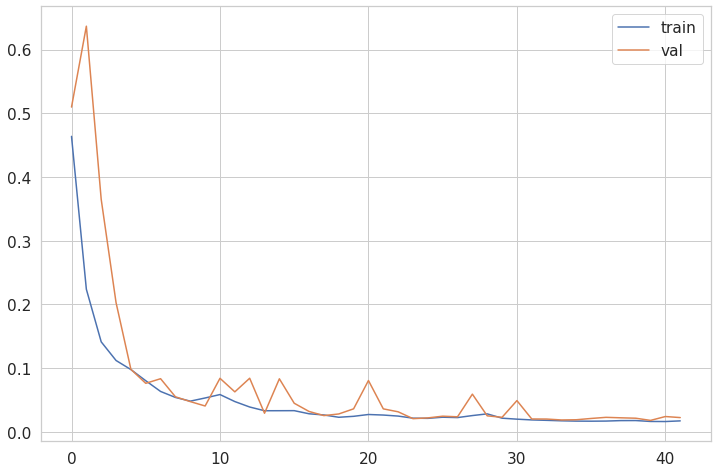

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854], 'val': [0.509788990020752, 0.6367778778076172, 0.3649303913116455, 0.202875554561615, 

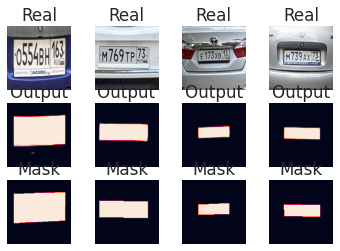

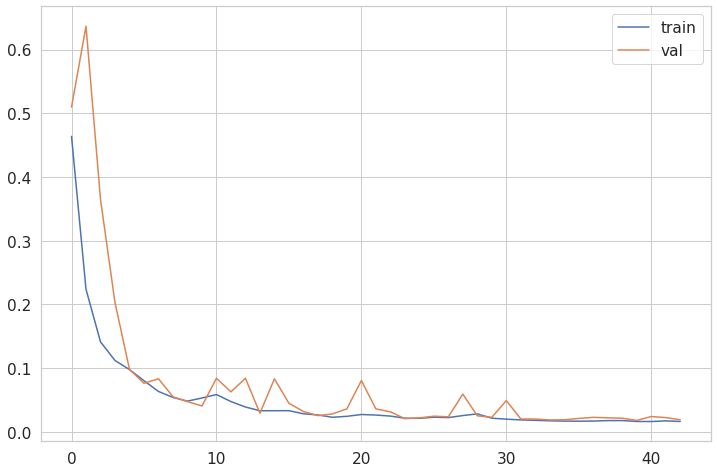

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957], 'val': [0.509788990020752, 0.6367778778076172, 0.364930391311645

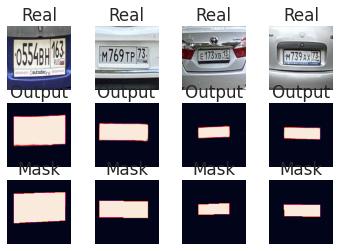

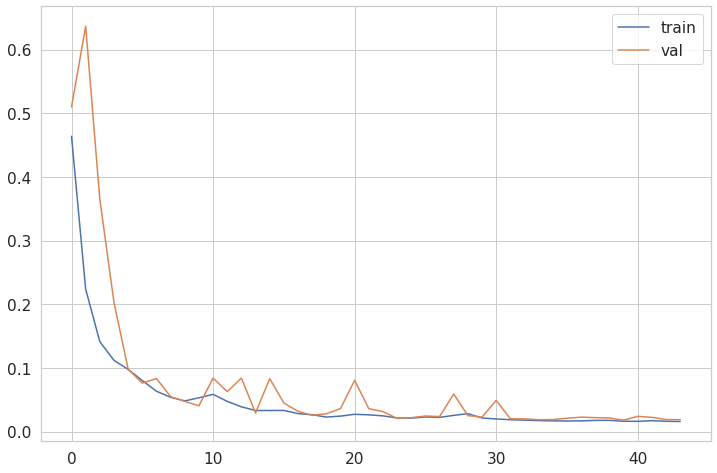

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645], 'val': [0.509788990020752, 0.6367778778076

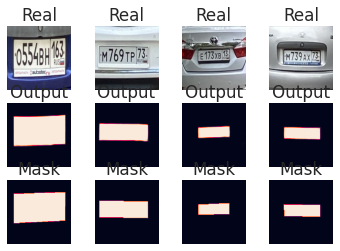

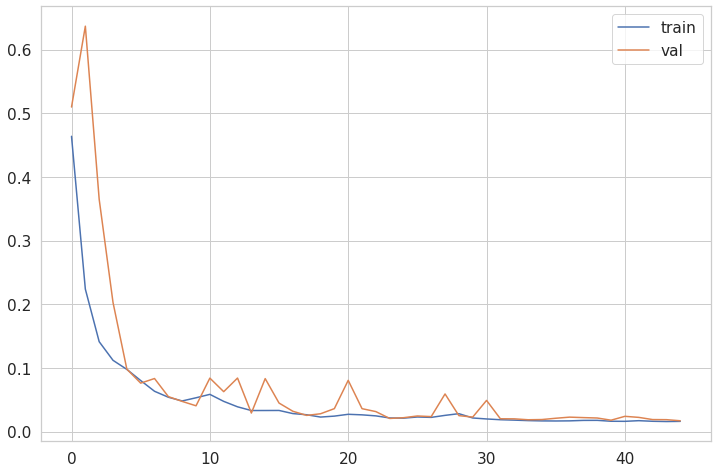

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132], 'val': [0.50978899002

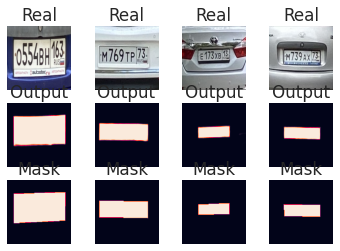

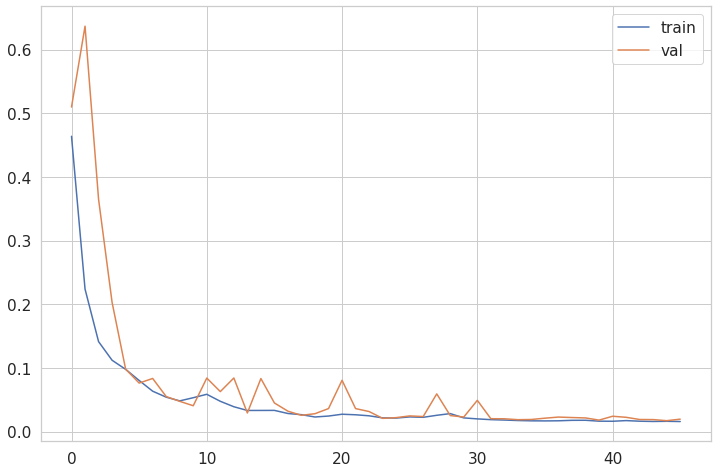

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944],

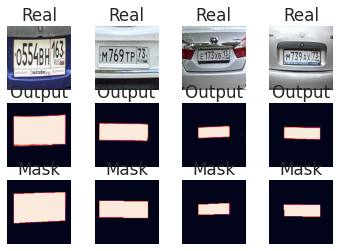

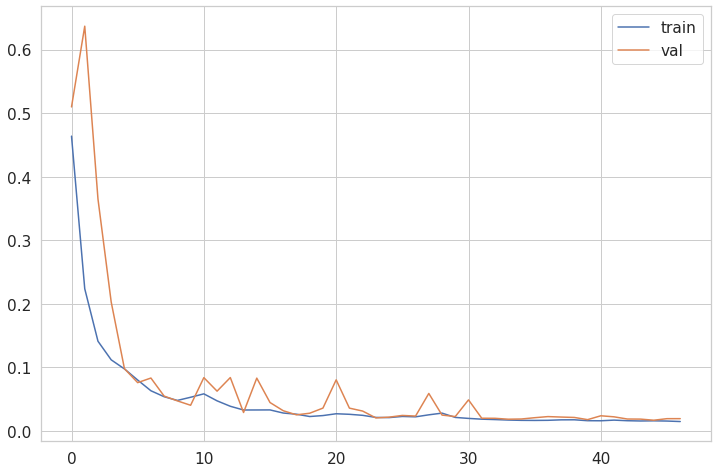

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

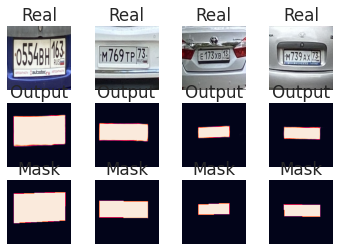

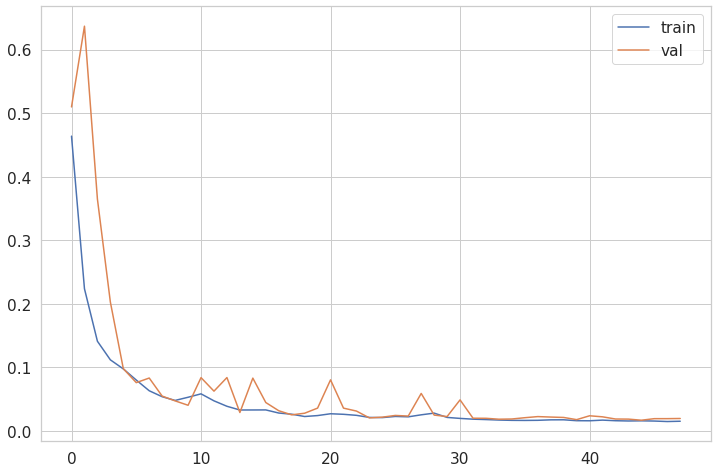

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

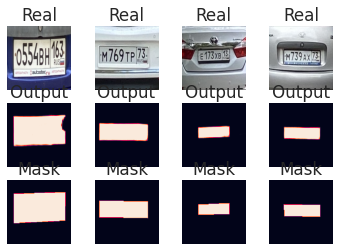

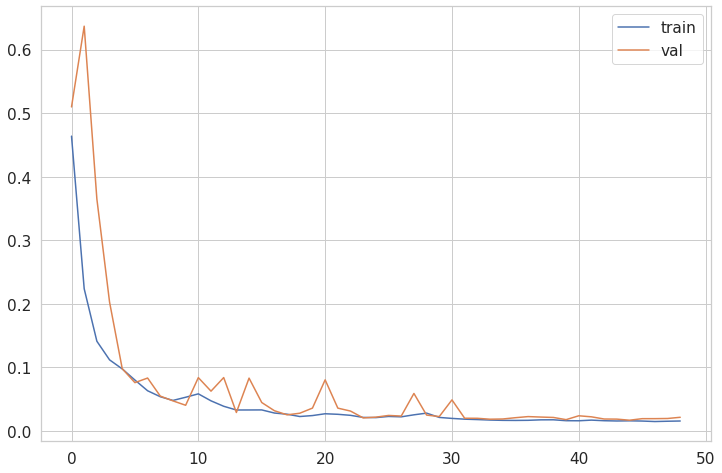

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

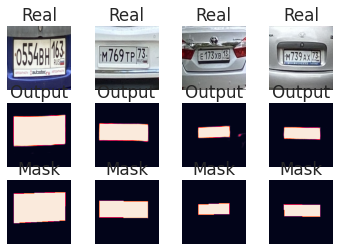

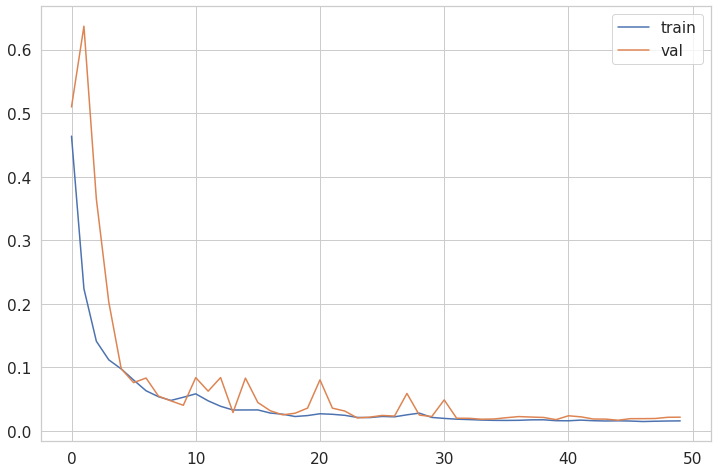

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

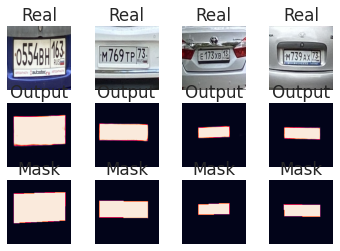

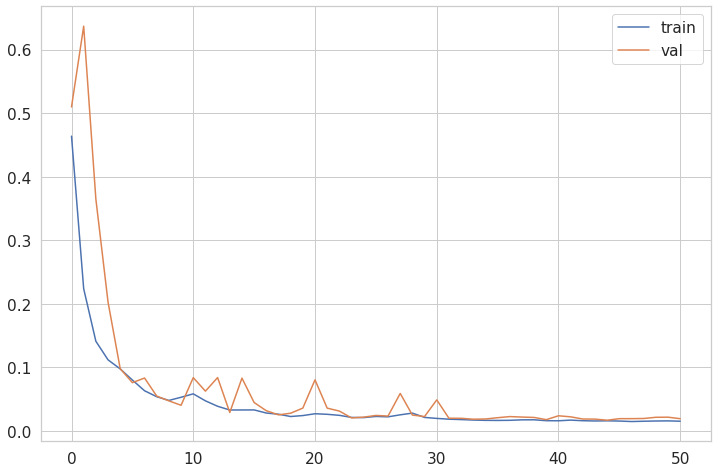

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

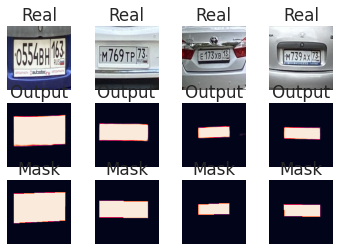

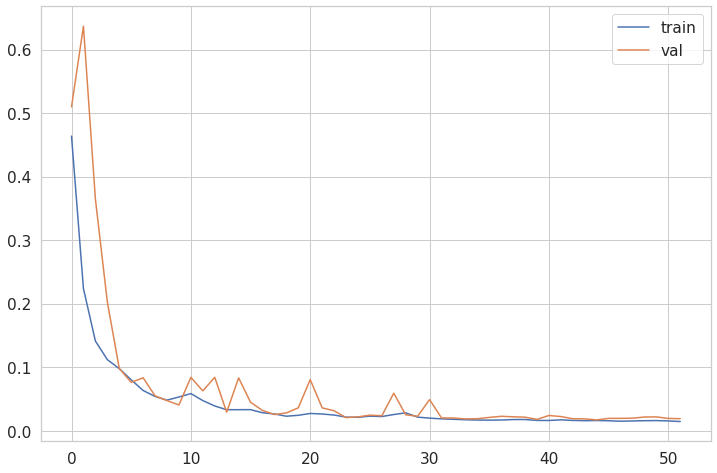

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

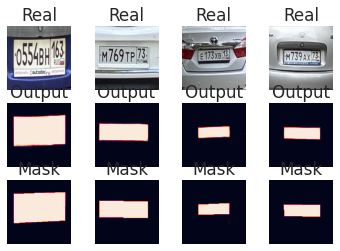

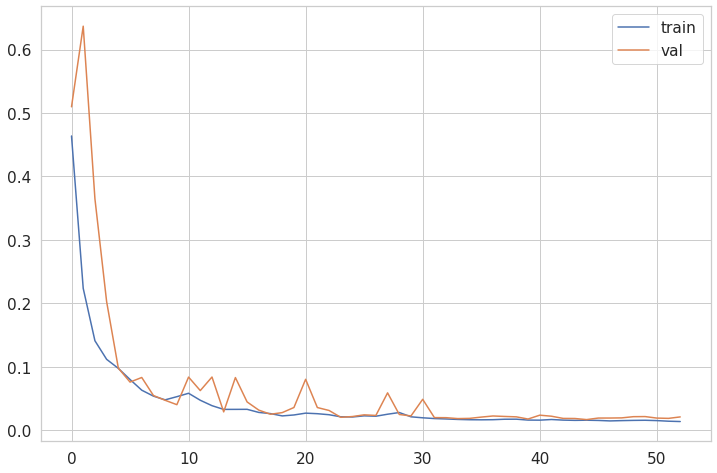

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

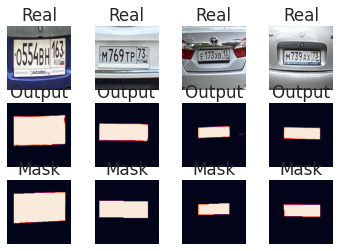

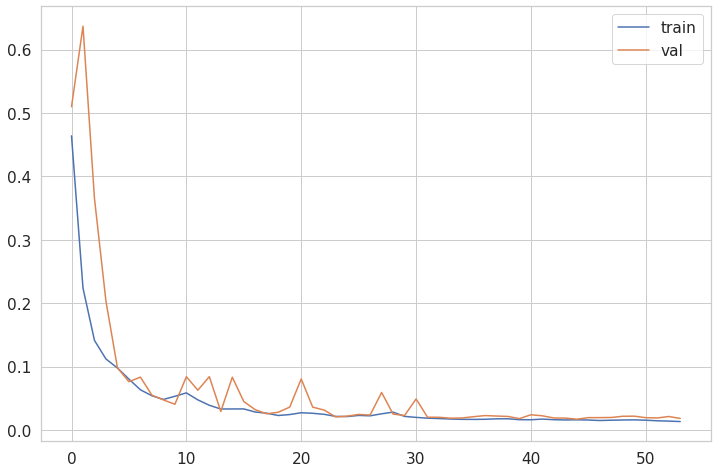

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

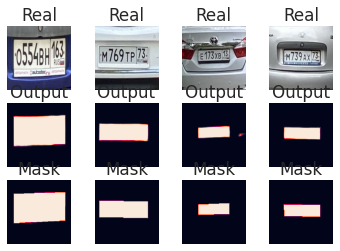

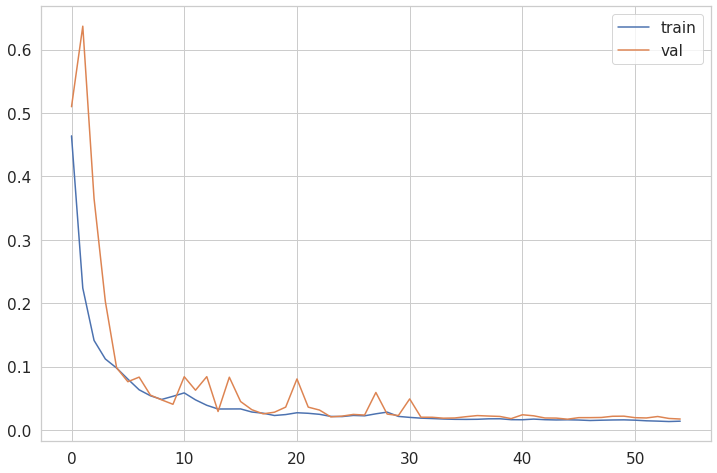

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

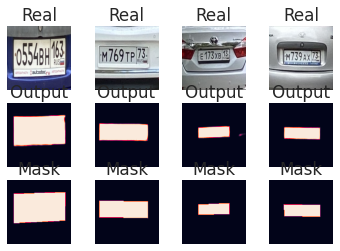

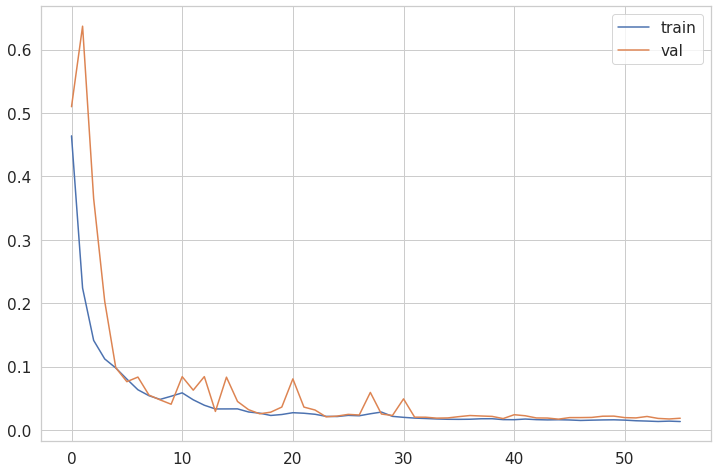

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

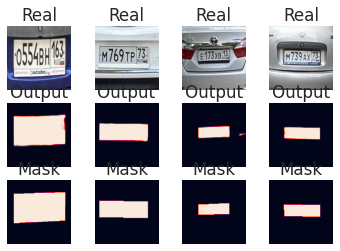

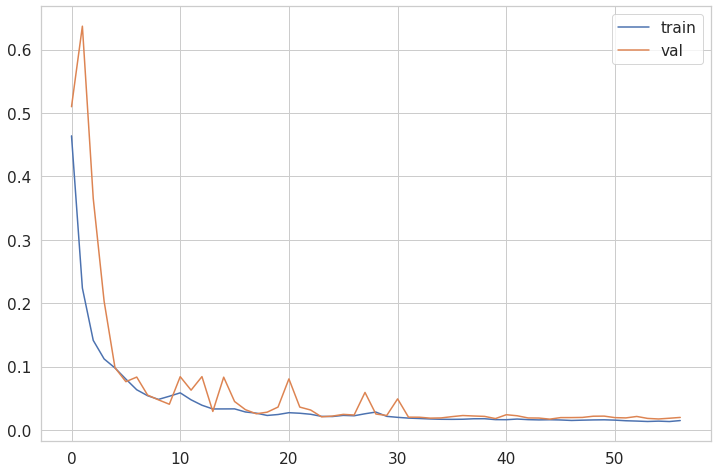

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

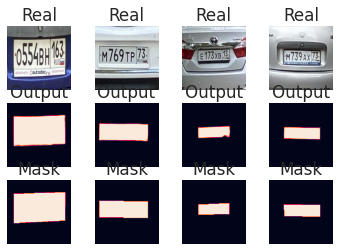

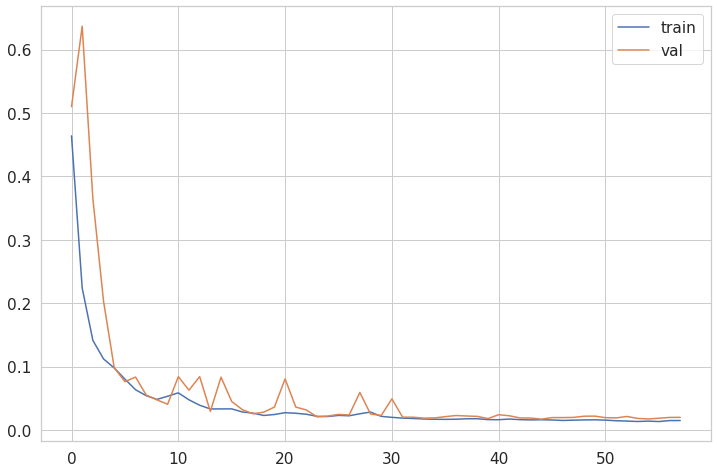

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

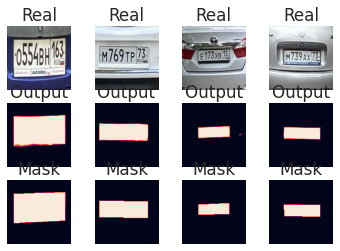

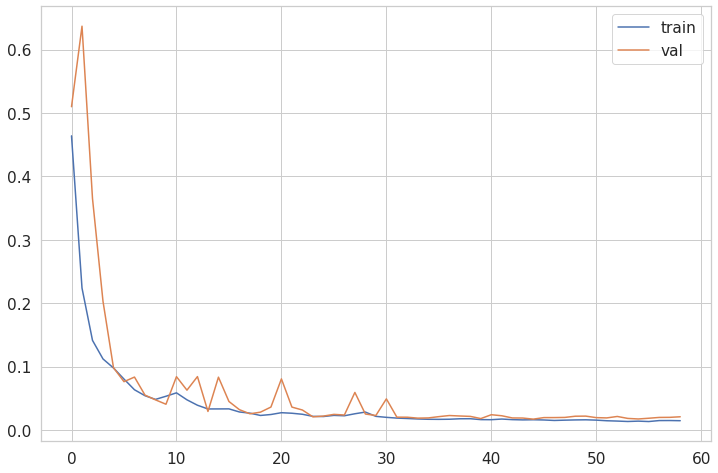

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

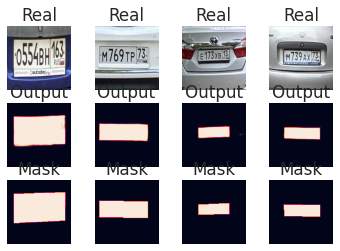

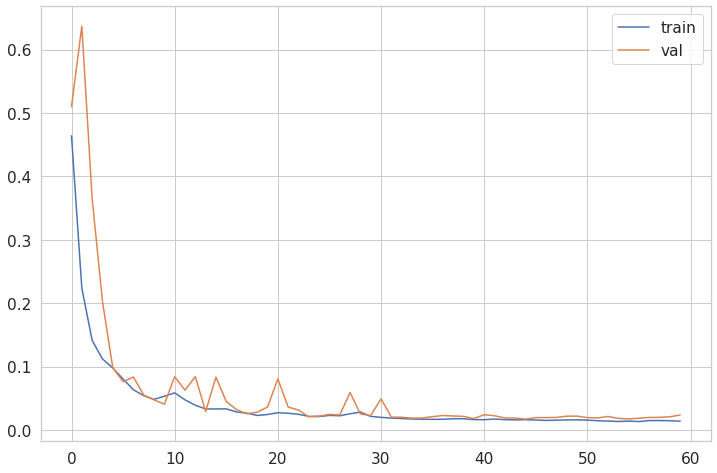

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

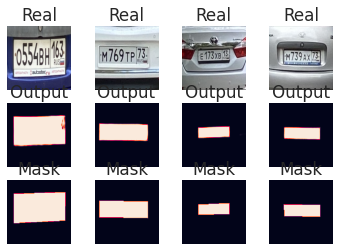

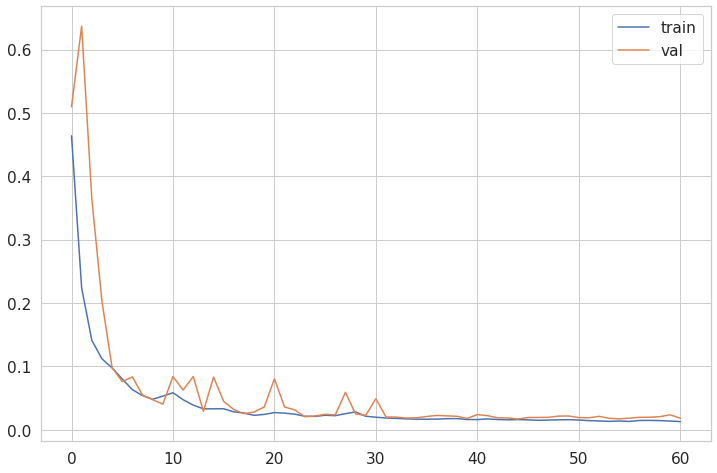

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

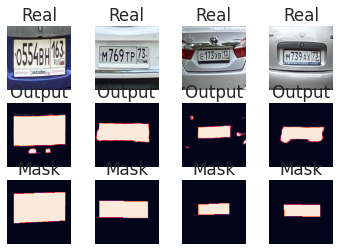

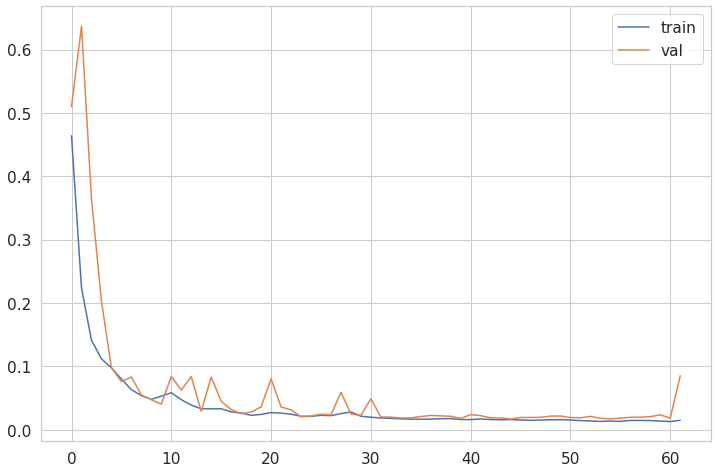

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

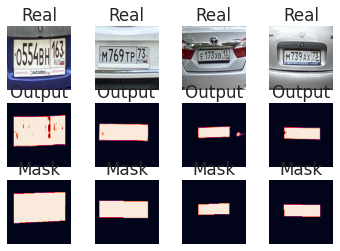

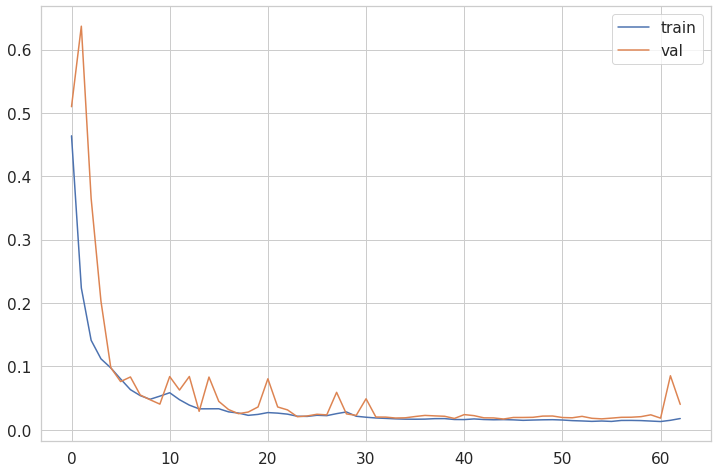

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

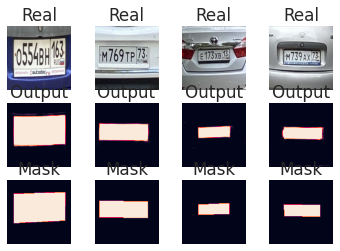

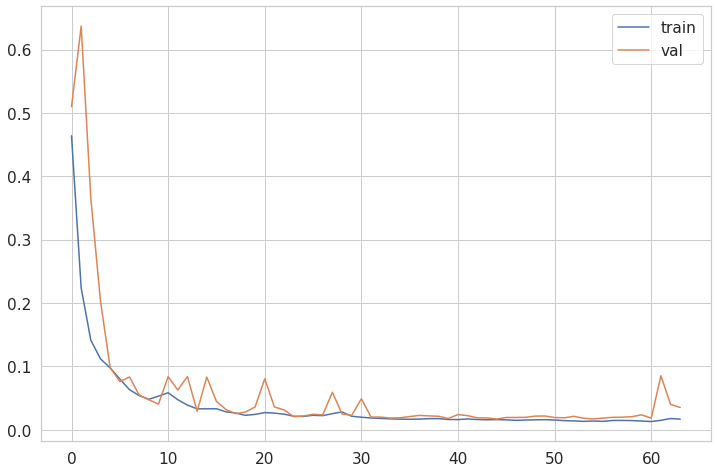

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

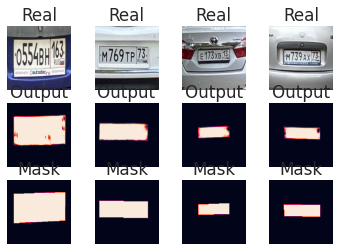

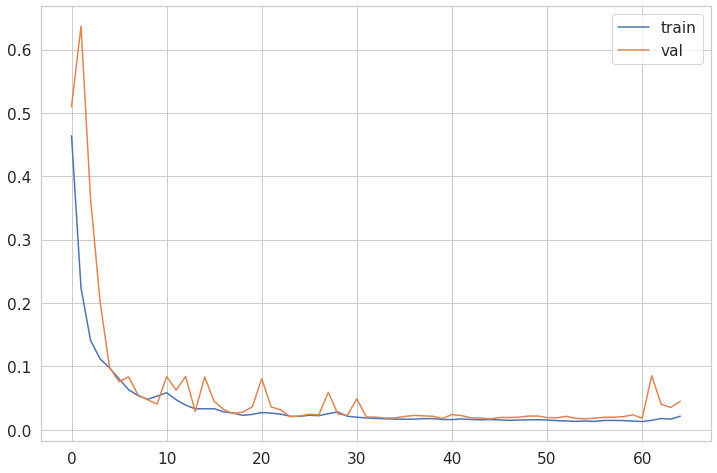

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

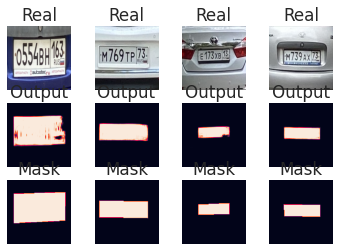

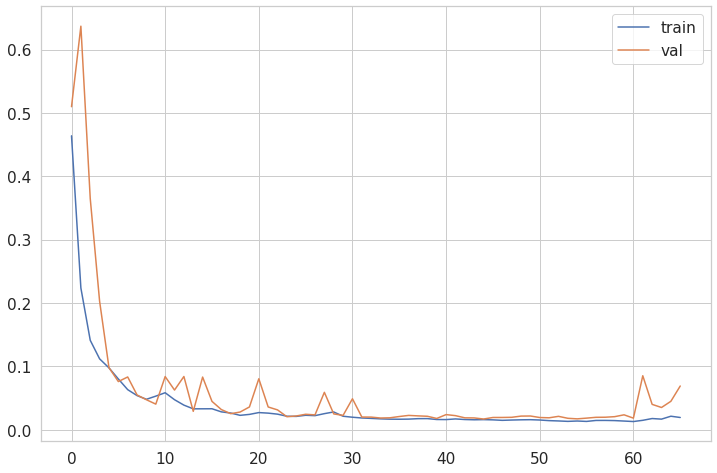

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

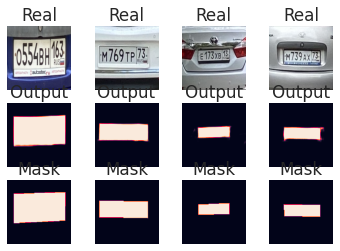

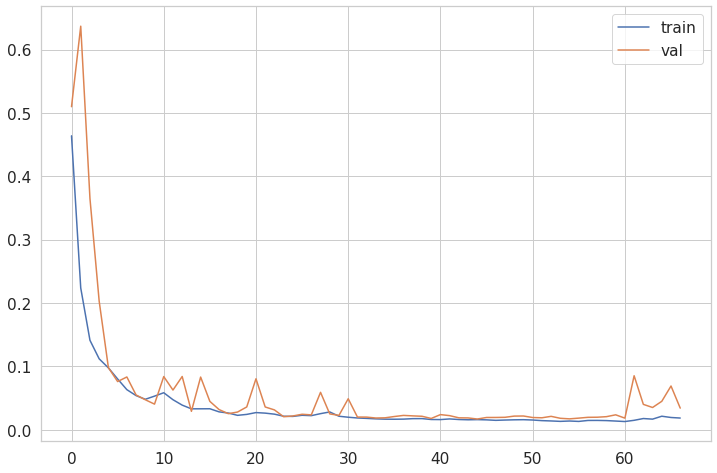

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

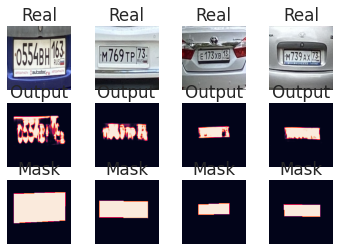

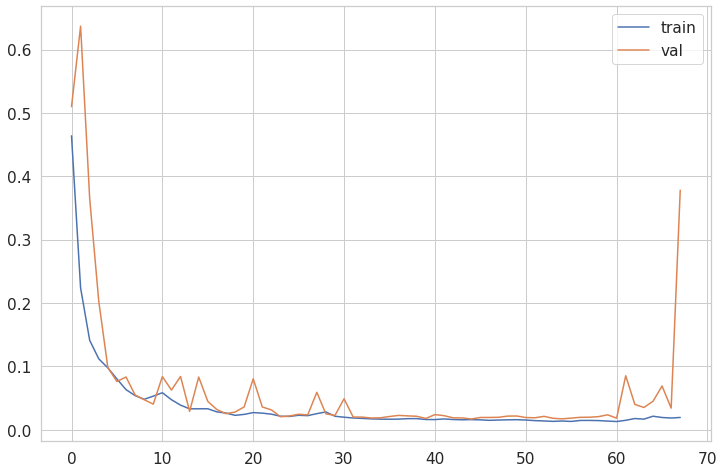

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

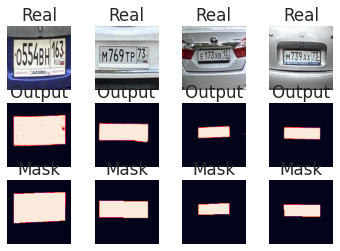

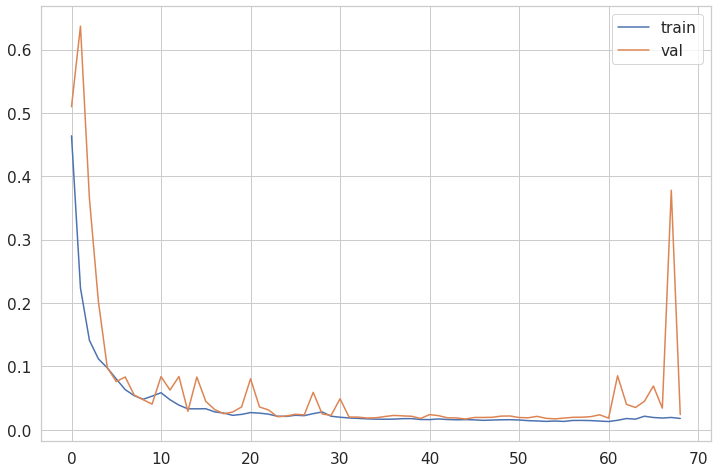

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

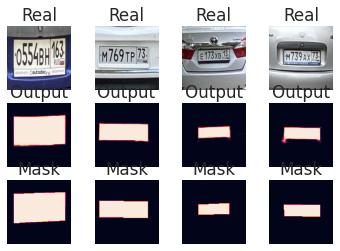

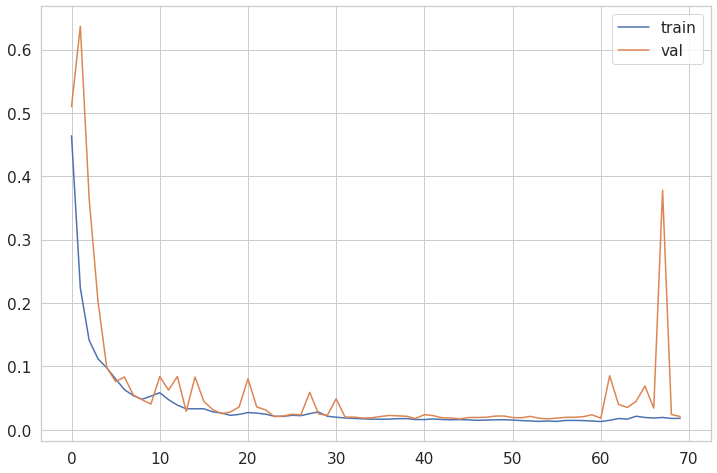

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

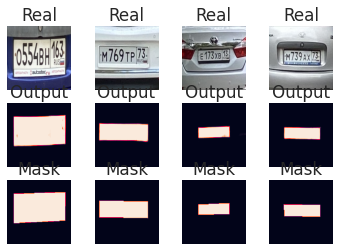

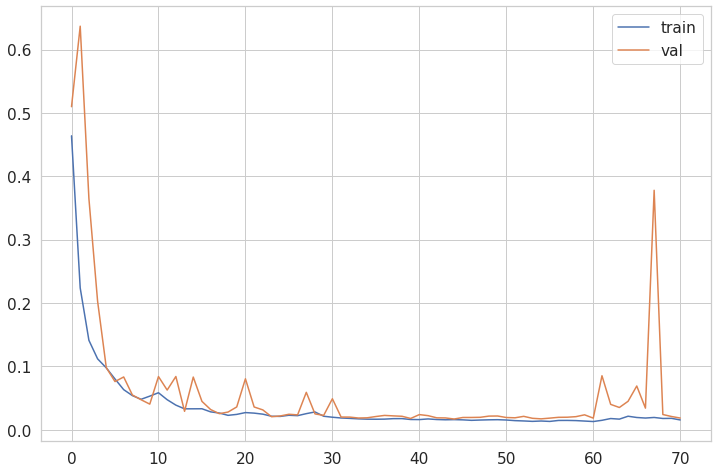

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

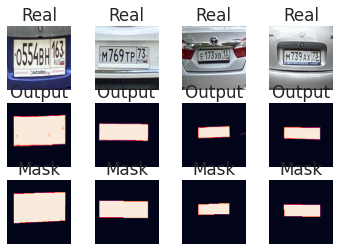

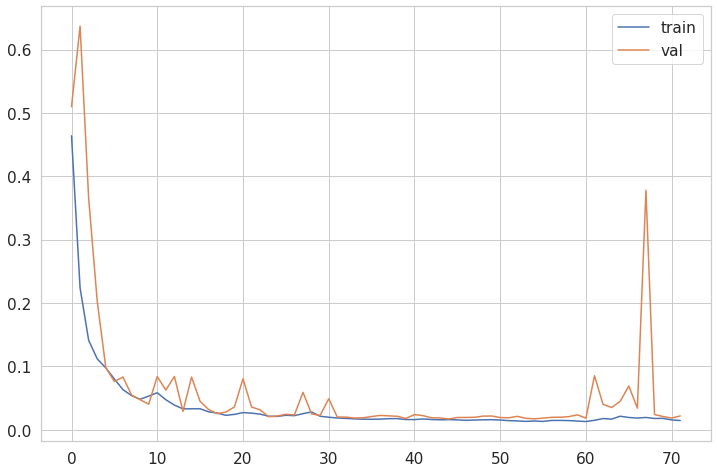

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

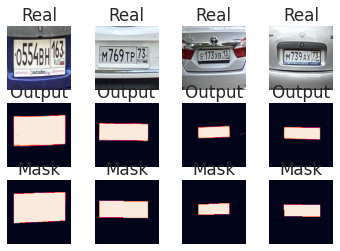

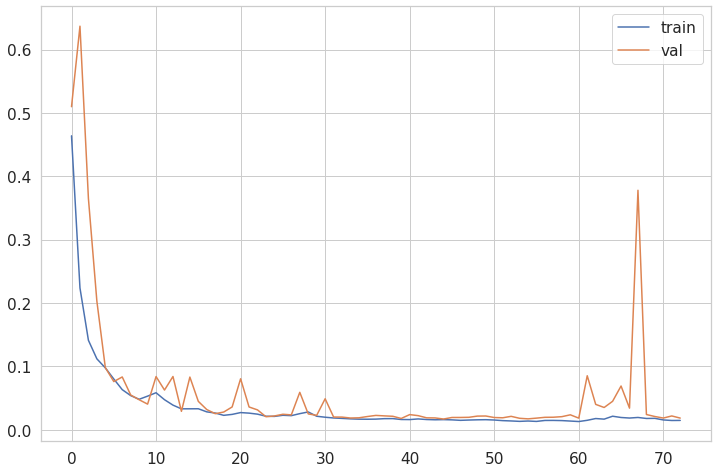

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

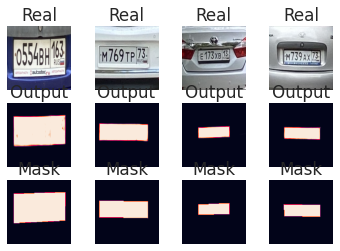

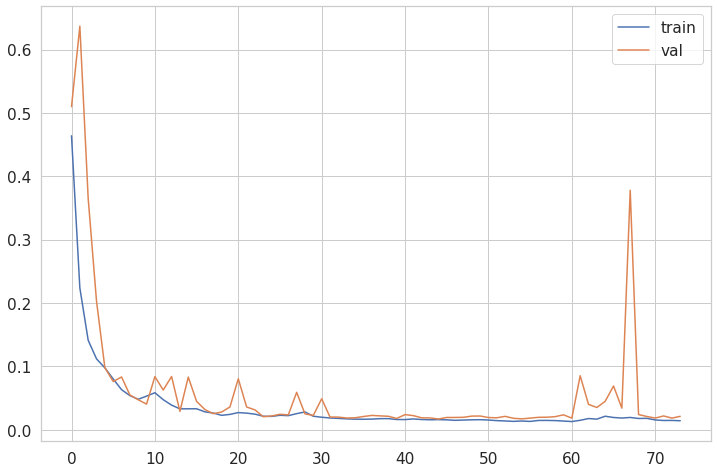

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

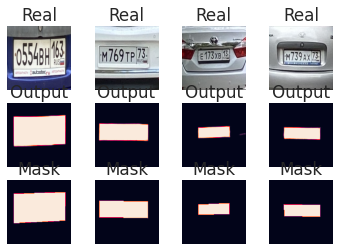

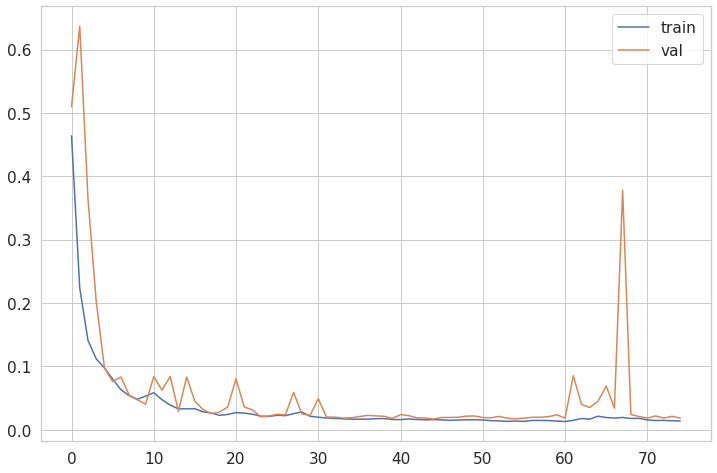

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

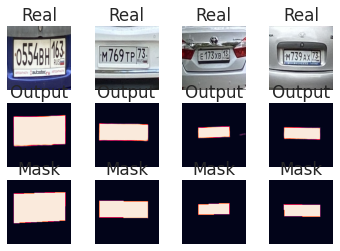

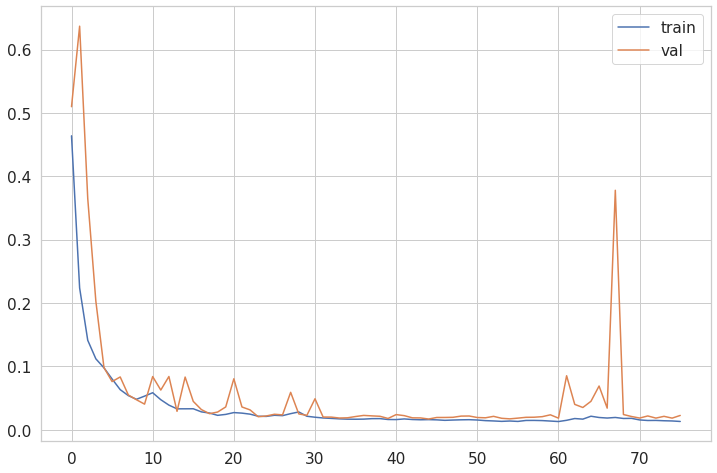

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

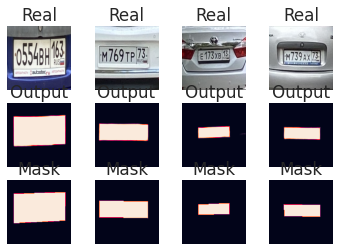

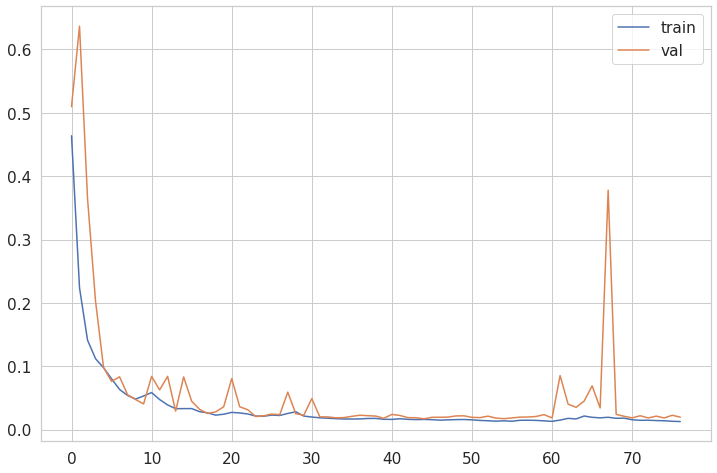

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

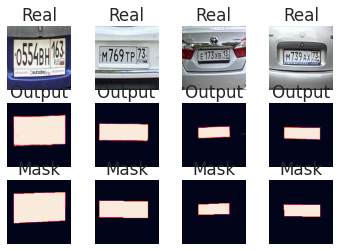

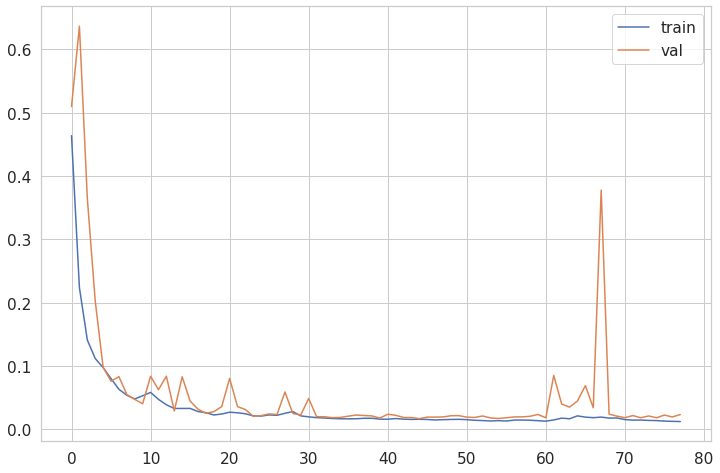

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

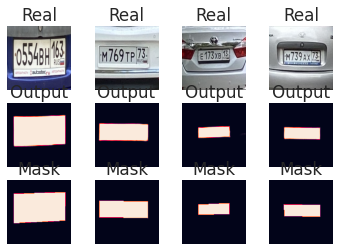

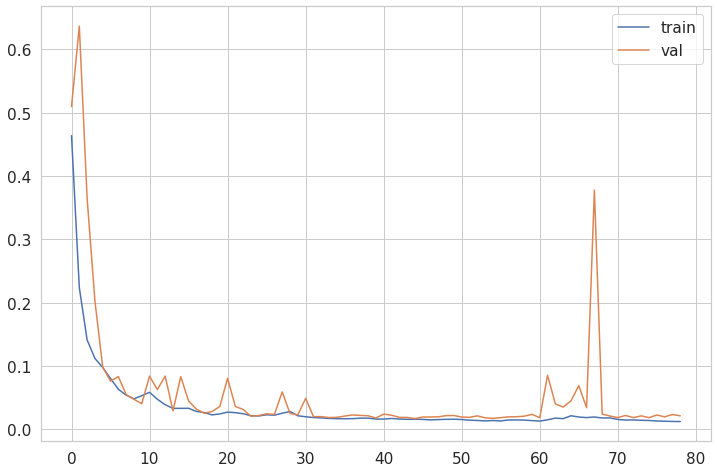

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

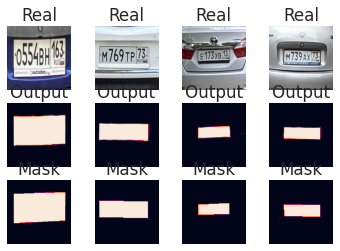

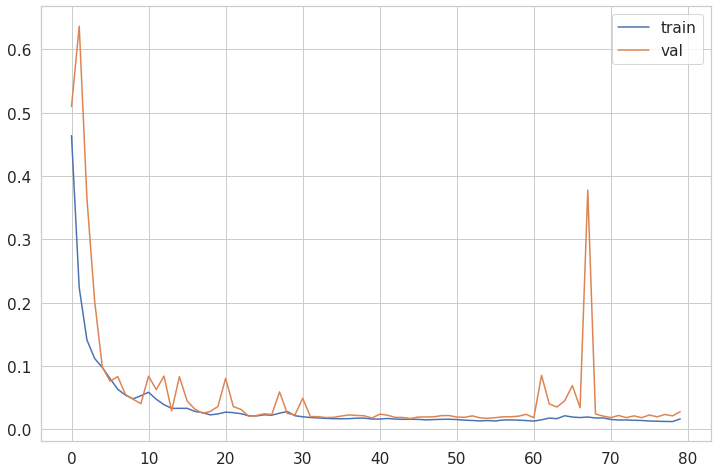

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

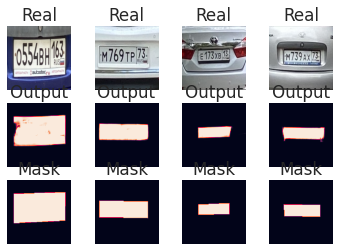

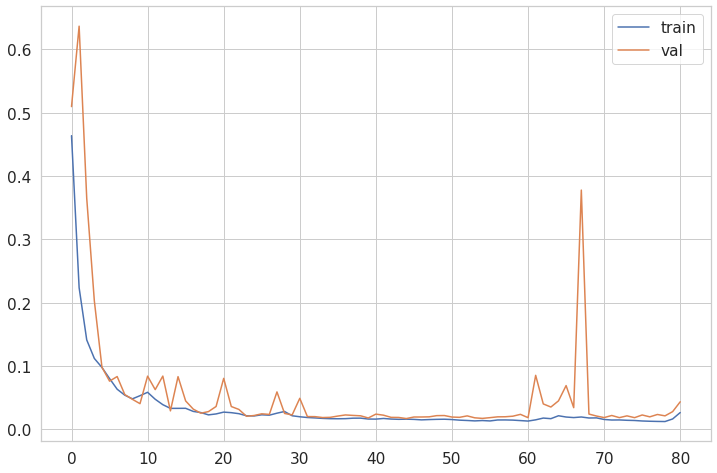

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

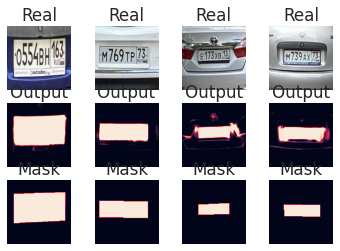

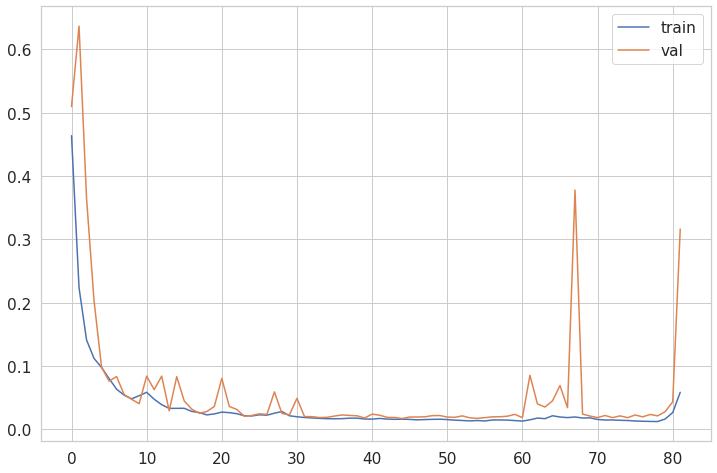

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

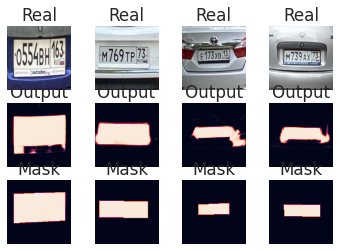

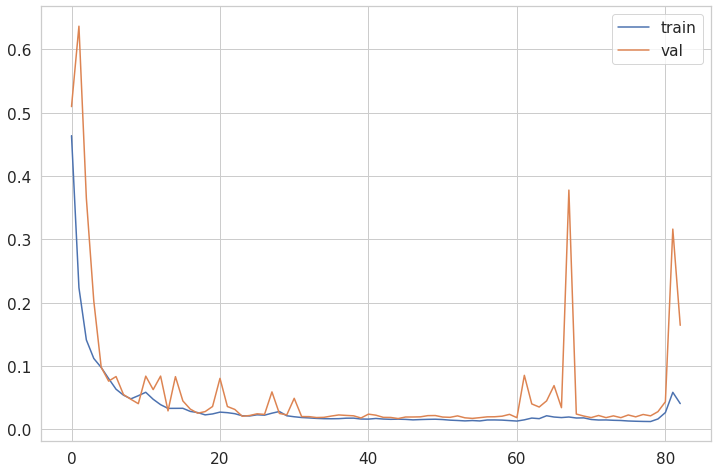

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

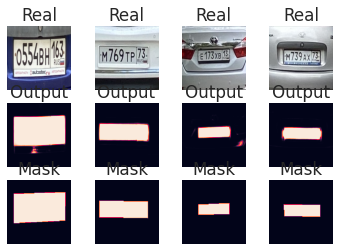

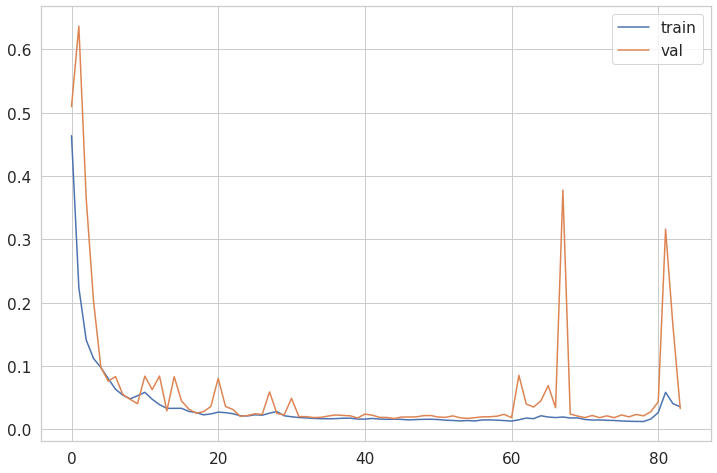

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

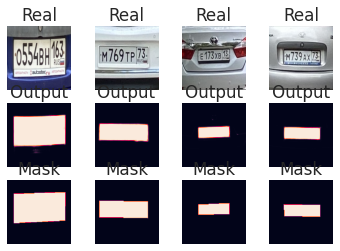

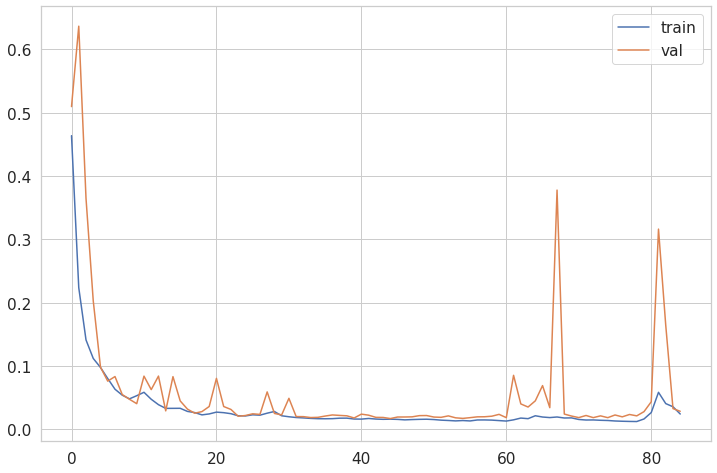

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

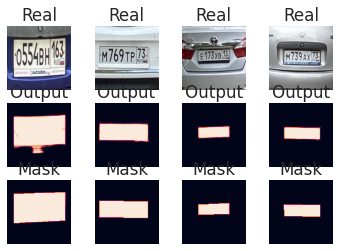

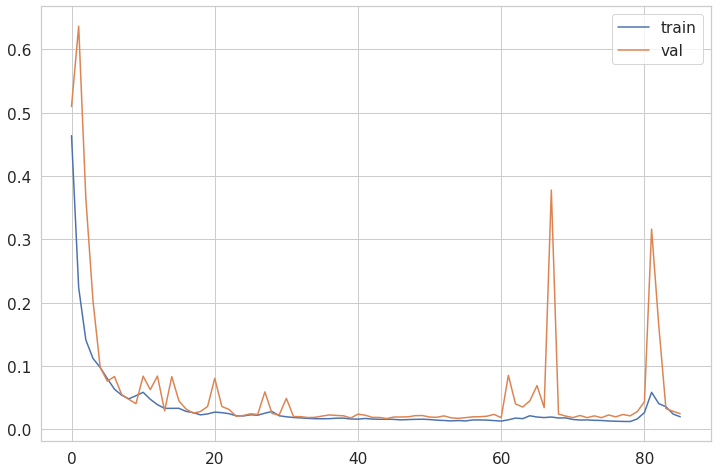

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

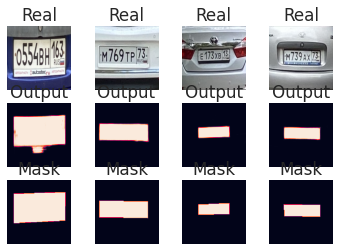

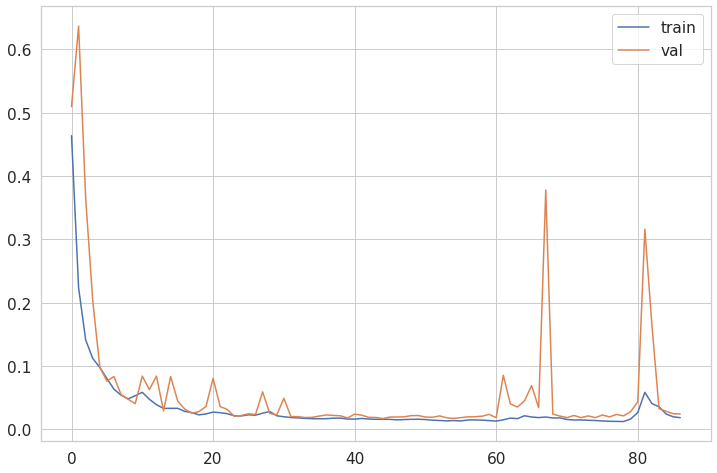

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

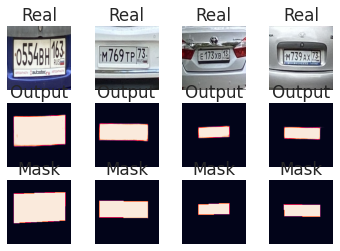

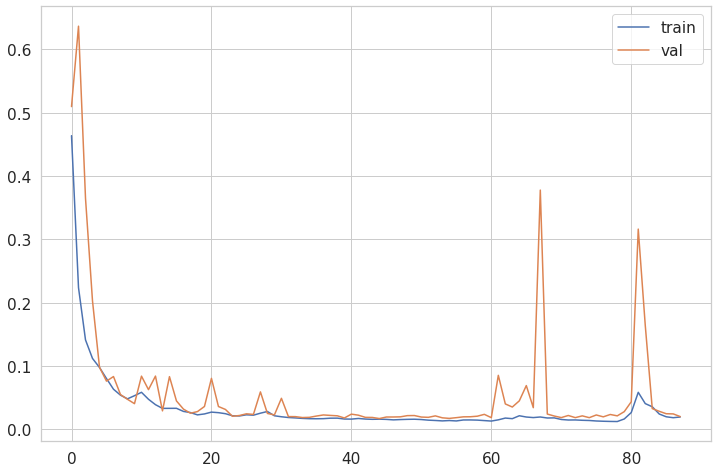

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

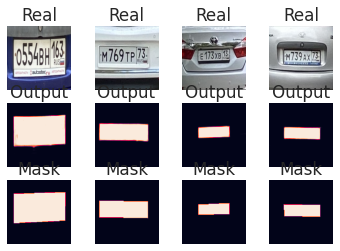

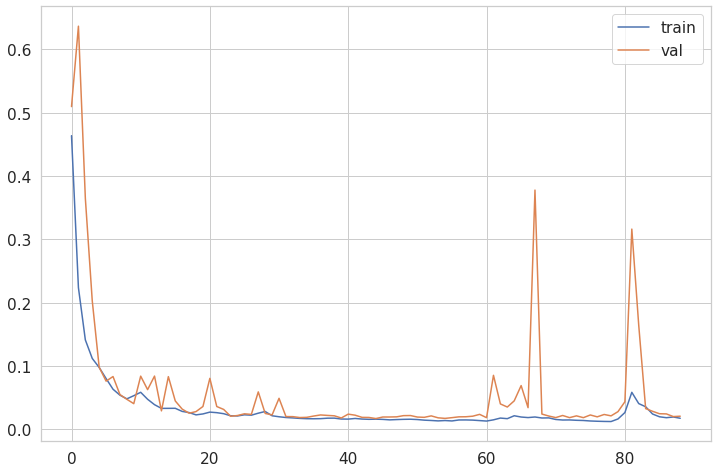

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

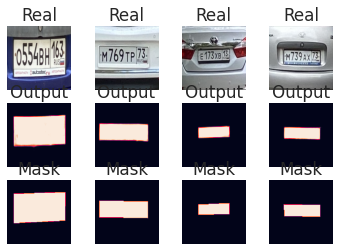

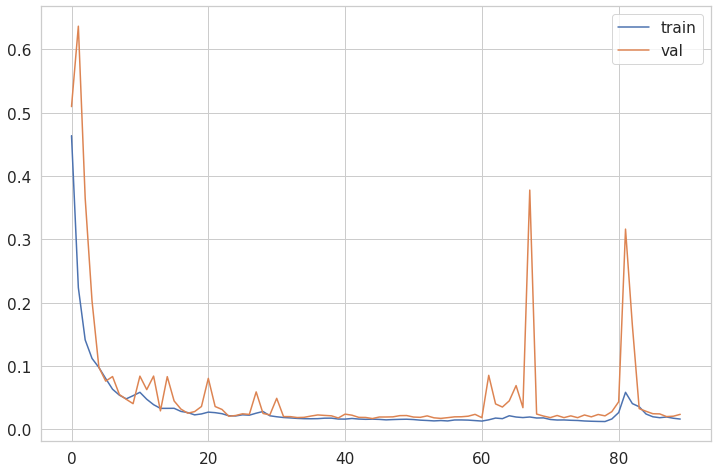

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

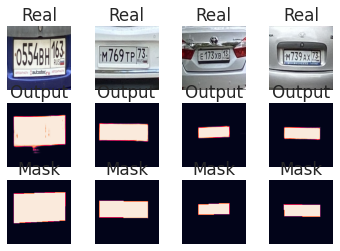

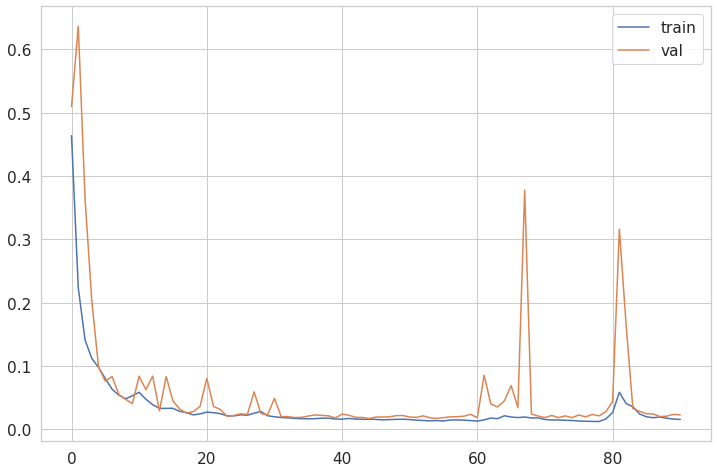

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

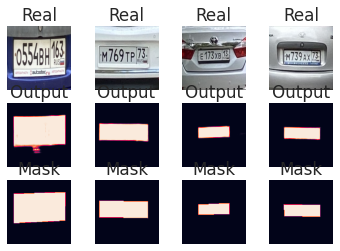

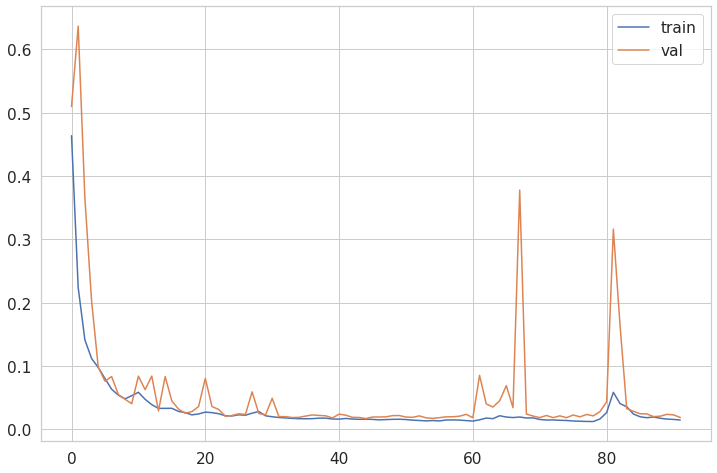

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

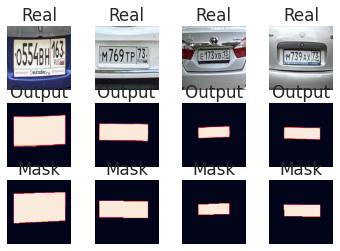

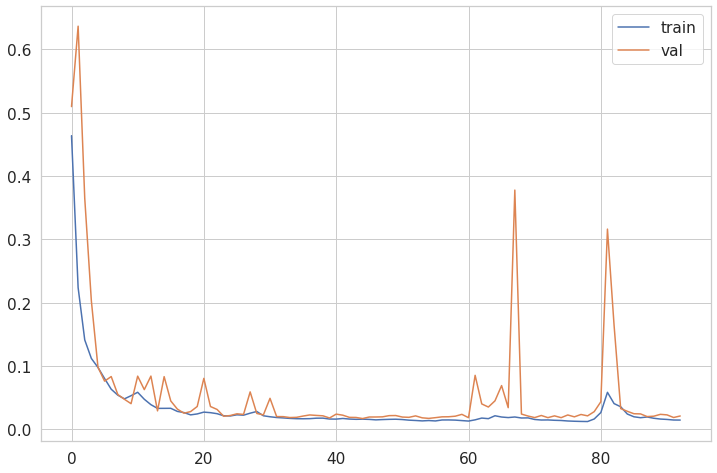

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

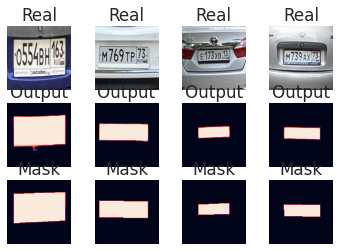

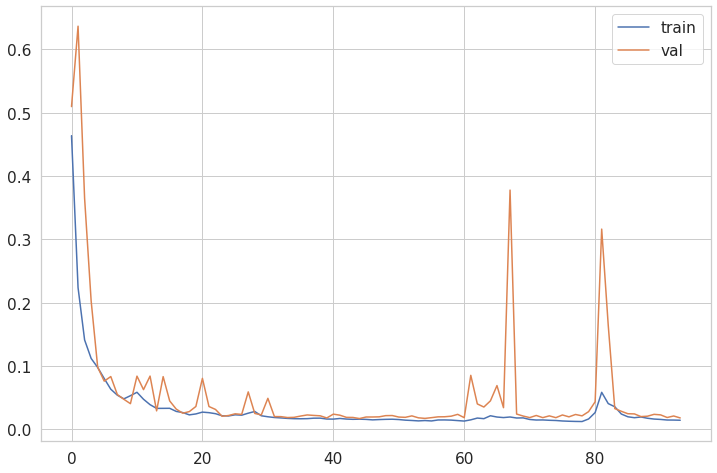

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

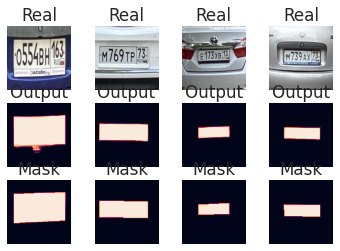

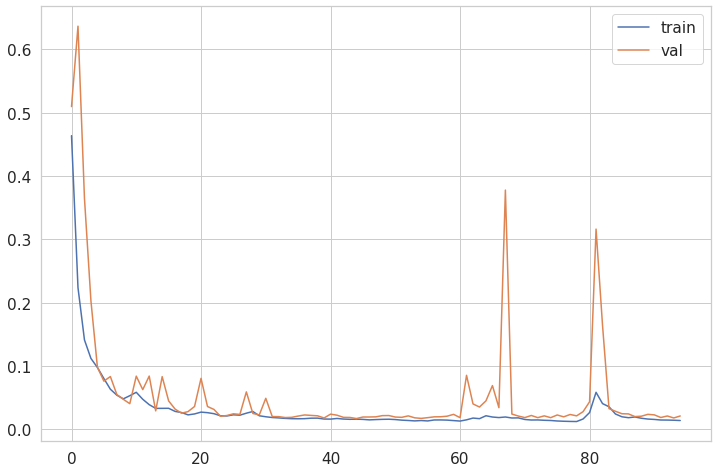

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

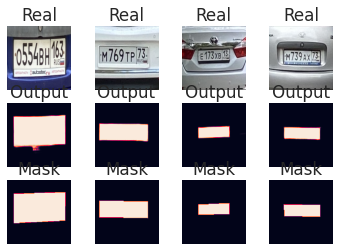

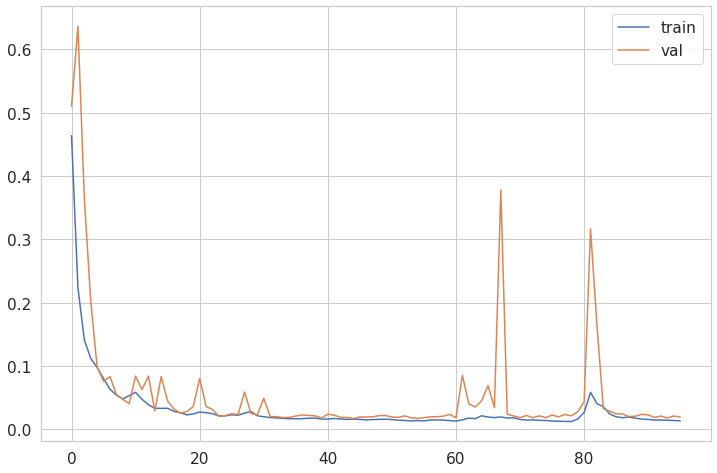

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

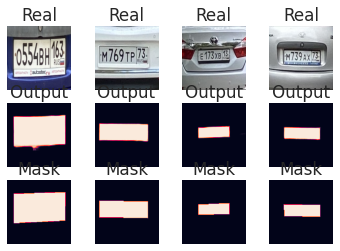

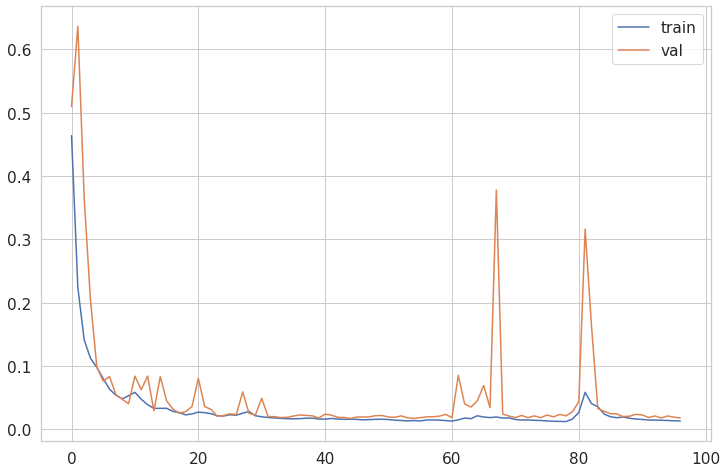

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

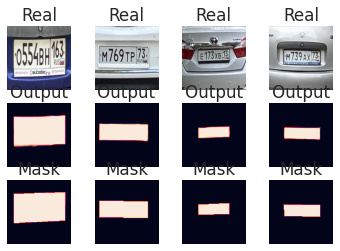

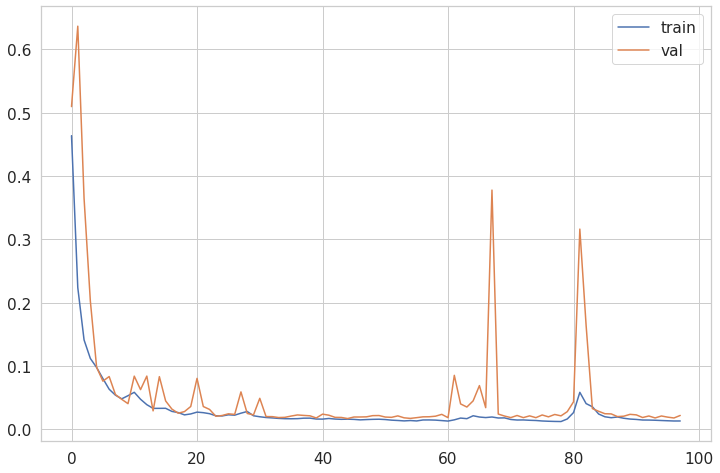

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

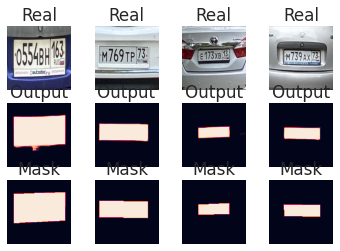

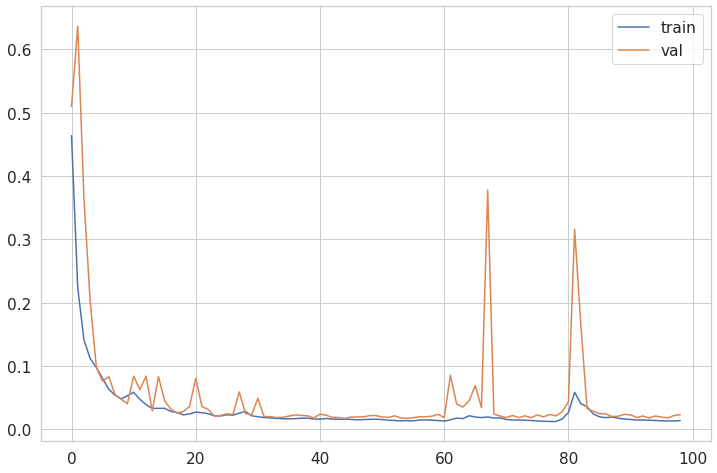

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

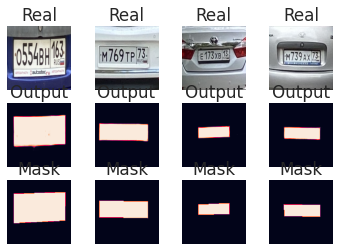

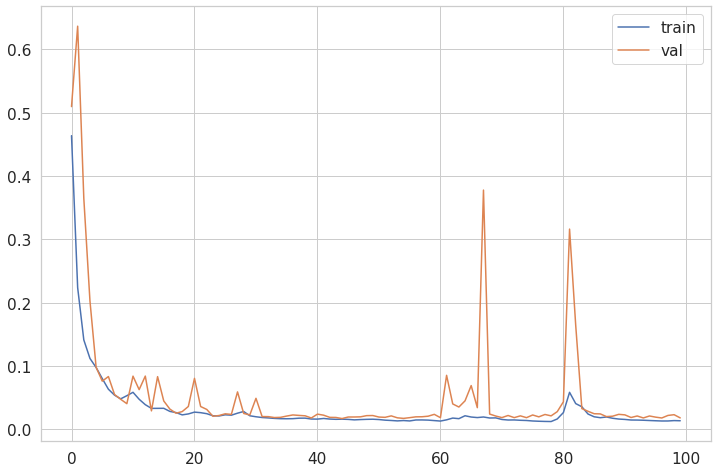

{'train': [0.4638361930847168, 0.22379903495311737, 0.1412639021873474, 0.11200206726789474, 0.09774596244096756, 0.08024898916482925, 0.06338948756456375, 0.054012469947338104, 0.04818958416581154, 0.053160153329372406, 0.058533284813165665, 0.04753051698207855, 0.03898480534553528, 0.033127110451459885, 0.03317313641309738, 0.033251527696847916, 0.028350751847028732, 0.02649695612490177, 0.022877253592014313, 0.02435946650803089, 0.027219543233513832, 0.026355726644396782, 0.0247406717389822, 0.021453961730003357, 0.021174989640712738, 0.022977229207754135, 0.022382570430636406, 0.025539569556713104, 0.02820504829287529, 0.021445240825414658, 0.01989571377635002, 0.01869954913854599, 0.01806148886680603, 0.017313411459326744, 0.016843488439917564, 0.016721658408641815, 0.016905544325709343, 0.017633885145187378, 0.01771271601319313, 0.016300320625305176, 0.016178447753190994, 0.017200641334056854, 0.016263309866189957, 0.015854258090257645, 0.01610306277871132, 0.015740666538476944, 

In [43]:
from torch import nn, optim
loss_implementations={'bce_loss':nn.BCELoss}
# loss_implementations={'bce_loss':bce_loss, 'dice_loss':dice_loss,'focal_loss':focal_loss,'tversky_loss':tversky_loss}
# model_list={'segnet':SegNet}

model = UNet().to(device)


max_epochs = 100
opt = optim.Adam(model.parameters(), lr=0.001)
# criterion = nn.BCELoss
criterion = bce_loss

train(f"upgraded-plate-mask.pt", model, opt, criterion, max_epochs, data_tr, data_val)

In [44]:
torch.save(model.state_dict(), "plate_dataset/upgraded-plate-mask.pt")

In [45]:
!mv best-upgraded-plate-mask.pt plate_dataset/best-upgraded-plate-mask.pt